# EDA

# 1. Libraries & Data Loading

In [1]:
# Data manipulation and analysis
import pandas as pd
import numpy as np
from pandas.api.types import is_numeric_dtype
import os  # for handling file paths, loading data files etc.

# Visualization - static and interactive
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import missingno as msno 
import pycountry 

from plotly.subplots import make_subplots
import plotly.figure_factory as ff

# Utilities
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)



In [2]:
# data loading
df = pd.read_csv('Data/human_trafficking.csv', low_memory=False)
df.head()

,yearOfRegistration,Datasource,gender,ageBroad,majorityStatus,majorityStatusAtExploit,majorityEntry,citizenship,meansOfControlDebtBondage,meansOfControlTakesEarnings,...,typeOfSexPrivateSexualServices,typeOfSexConcatenated,isAbduction,RecruiterRelationship,CountryOfExploitation,recruiterRelationIntimatePartner,recruiterRelationFriend,recruiterRelationFamily,recruiterRelationOther,recruiterRelationUnknown
0,2002,Case Management,Female,18--20,Adult,-99,-99,CO,-99,-99,...,-99,-99,-99,-99,-99,0,0,0,0,1
1,2002,Case Management,Female,18--20,Adult,-99,-99,CO,-99,-99,...,-99,-99,-99,-99,-99,0,0,0,0,1
2,2002,Case Management,Female,18--20,Adult,-99,-99,CO,-99,-99,...,-99,-99,-99,-99,-99,0,0,0,0,1
3,2002,Case Management,Female,18--20,Adult,-99,-99,CO,-99,-99,...,-99,-99,-99,-99,-99,0,0,0,0,1
4,2002,Case Management,Female,18--20,Adult,-99,-99,CO,-99,-99,...,-99,-99,-99,-99,-99,0,0,0,0,1


In [3]:
# -99 are considered mising values (NaN), so we convert them for easier handling
df.replace('-99', np.nan, inplace=True)
df.replace(-99, np.nan, inplace=True)

Description of some features for clarification (taken from the official page of CTDC):
- yearOfRegistration: The year in which the individual was assisted/identified/referred/reported to the contributing organizations
- gender: gender and sex (i.e., sex assigned at birth) are not differentiated
- ageBroad: The individual's age at the time the individual was assisted/identified/referred/reported to the contributing organizations.
- citizenship
- CountryOfExploitation: This variable indicates the country where a victim is first supported/assisted, identified and/or referred

# 2. EDA

In [4]:
df.shape

(48801, 63)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48801 entries, 0 to 48800
Data columns (total 63 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   yearOfRegistration                      48801 non-null  int64  
 1   Datasource                              48801 non-null  object 
 2   gender                                  48801 non-null  object 
 3   ageBroad                                36439 non-null  object 
 4   majorityStatus                          36439 non-null  object 
 5   majorityStatusAtExploit                 9290 non-null   object 
 6   majorityEntry                           6491 non-null   object 
 7   citizenship                             48523 non-null  object 
 8   meansOfControlDebtBondage               2496 non-null   float64
 9   meansOfControlTakesEarnings             3997 non-null   float64
 10  meansOfControlRestrictsFinancialAccess  253 non-null    fl

In [6]:
df.isnull().sum()

yearOfRegistration                      0
Datasource                              0
gender                                  0
ageBroad                            12362
majorityStatus                      12362
                                    ...  
recruiterRelationIntimatePartner     8807
recruiterRelationFriend              8807
recruiterRelationFamily              8807
recruiterRelationOther               8807
recruiterRelationUnknown               77
Length: 63, dtype: int64

#### some preprocessing

## 2.1 Feature Analysis

### 2.1.0 Time & Source Information

#### yearOfRegistration

In [7]:
print(df[['yearOfRegistration']].info())
print(df['yearOfRegistration'].describe())
print(df[['yearOfRegistration']].isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48801 entries, 0 to 48800
Data columns (total 1 columns):
 #   Column              Non-Null Count  Dtype
---  ------              --------------  -----
 0   yearOfRegistration  48801 non-null  int64
dtypes: int64(1)
memory usage: 381.4 KB
None
count    48801.000000
mean      2014.144218
std          4.025566
min       2002.000000
25%       2013.000000
50%       2016.000000
75%       2017.000000
max       2019.000000
Name: yearOfRegistration, dtype: float64
yearOfRegistration    0
dtype: int64


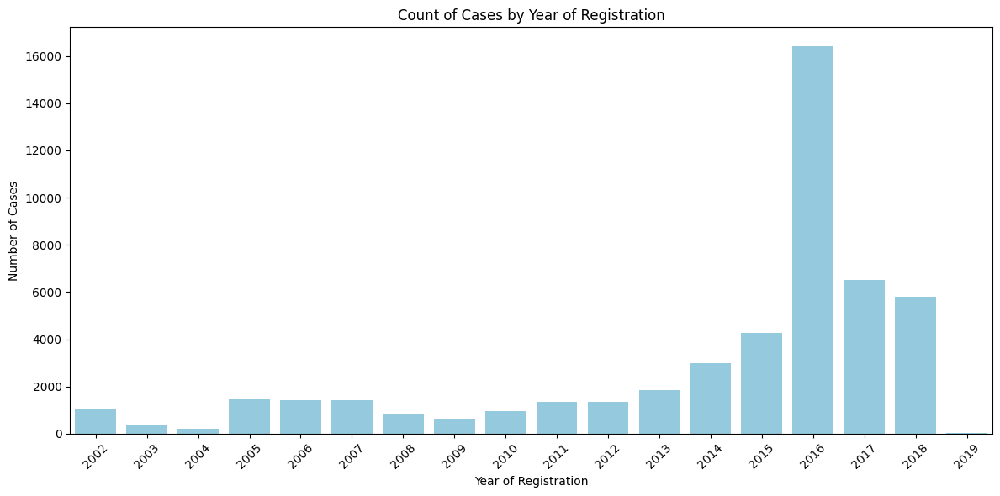

In [8]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='yearOfRegistration', color='skyblue') 
plt.title("Count of Cases by Year of Registration")
plt.xlabel("Year of Registration")
plt.ylabel("Number of Cases")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

*** from this we can get that 2016 was the golden year of human trafficking (maybe some event triggered it? Some social event? crisis? migrations?).It could be also a backlog of cases being officially registered that year Also the recent years are more prominent, but 2019 is too low after all that peak maybe they didnt collect the whole year data. Maybe that year they included some law which made its spike

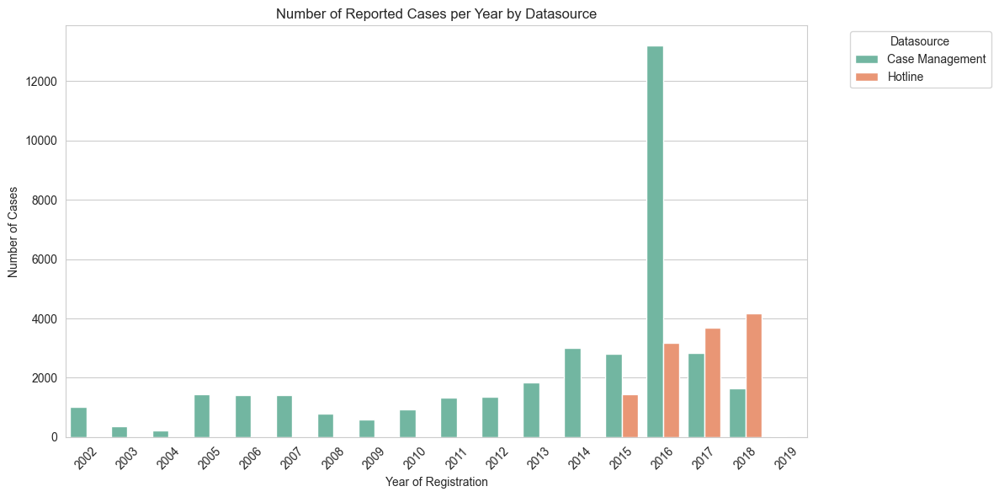

In [9]:
# Set the plot size and style
plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")

# Plot the count of cases per year, separated by datasource
sns.countplot(data=df.dropna(subset=['Datasource', 'yearOfRegistration']), 
              x='yearOfRegistration', 
              hue='Datasource', 
              palette='Set2')

# Customize the plot
plt.title("Number of Reported Cases per Year by Datasource")
plt.xlabel("Year of Registration")
plt.ylabel("Number of Cases")
plt.xticks(rotation=45)
plt.legend(title="Datasource", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Show the plot
plt.show()



In [10]:
# Exploitation features to visualize
exploitation_features = [
    'isForcedLabour', 'isSexualExploit', 'isOtherExploit', 'isSexAndLabour', 
    'isForcedMarriage', 'isForcedMilitary', 'isOrganRemoval', 'isSlaveryAndPractices'
]

# Melt the dataframe to long format
df_melted = df[['yearOfRegistration'] + exploitation_features].melt(id_vars='yearOfRegistration', 
                                                                     var_name='ExploitType', 
                                                                     value_name='Presence')

# Filter rows where Presence is 1 (indicating the presence of the exploit type)
df_melted = df_melted[df_melted['Presence'] == 1]

# Aggregate counts by year and exploit type
df_aggregated = df_melted.groupby(['yearOfRegistration', 'ExploitType']).size().reset_index(name='Count')

# Create an interactive Plotly bar chart
fig = px.bar(df_aggregated, 
             x="yearOfRegistration", 
             y="Count", 
             color="ExploitType", 
             barmode="stack",
             title="Trends in Exploitation Types by Year of Registration",
             labels={"yearOfRegistration": "Year of Registration", "Count": "Number of Cases"},
             height=600)

# Update layout for better readability
fig.update_layout(
    xaxis_title="Year of Registration",
    yaxis_title="Number of Cases",
    xaxis=dict(tickangle=45),
    barmode='stack',  # Stack bars to show the trend for each type of exploitation
)

# Show the plot
fig.show()


Early years: Sexual Exploitation > Forced Labour
Mid-years: Growth in Forced Labour
2016: Huge rise in Other Exploitation (plus new types appear)
After 2016: Sexual Exploitation dominates again, but dataset becomes more diverse in types.

All of this is affected by the lack of good data collection mentioned previosuly

In [11]:
# Sexual exploitation features to visualize
sexual_exploitation_features = [
    'typeOfSexProstitution', 'typeOfSexPornography', 'typeOfSexRemoteInteractiveServices', 'typeOfSexPrivateSexualServices'
]

# Melt the dataframe to long format
df_melted_sexual = df[['yearOfRegistration'] + sexual_exploitation_features].melt(id_vars='yearOfRegistration', 
                                                                                   var_name='ExploitType', 
                                                                                   value_name='Presence')

# Filter rows where Presence is 1 (indicating the presence of the exploit type)
df_melted_sexual = df_melted_sexual[df_melted_sexual['Presence'] == 1]

# Aggregate counts by year and exploit type
df_aggregated_sexual = df_melted_sexual.groupby(['yearOfRegistration', 'ExploitType']).size().reset_index(name='Count')

# Create an interactive Plotly bar chart
fig_sexual = px.bar(df_aggregated_sexual, 
                    x="yearOfRegistration", 
                    y="Count", 
                    color="ExploitType", 
                    barmode="stack",
                    title="Trends in Sexual Exploitation Types by Year of Registration",
                    labels={"yearOfRegistration": "Year of Registration", "Count": "Number of Cases"},
                    height=600)

# Update layout for better readability
fig_sexual.update_layout(
    xaxis_title="Year of Registration",
    yaxis_title="Number of Cases",
    xaxis=dict(tickangle=45),
    barmode='stack',  # Stack bars to show the trend for each type of exploitation
)

# Show the plot
fig_sexual.show()




In [12]:
# Labor exploitation features to visualize
labor_exploitation_features = [
    'typeOfLabourAgriculture', 'typeOfLabourAquafarming', 'typeOfLabourBegging', 'typeOfLabourConstruction',
    'typeOfLabourDomesticWork', 'typeOfLabourHospitality', 'typeOfLabourIllicitActivities', 'typeOfLabourManufacturing',
    'typeOfLabourMiningOrDrilling', 'typeOfLabourPeddling', 'typeOfLabourTransportation', 'typeOfLabourOther'
]

# Melt the dataframe to long format
df_melted_labor = df[['yearOfRegistration'] + labor_exploitation_features].melt(id_vars='yearOfRegistration', 
                                                                                 var_name='ExploitType', 
                                                                                 value_name='Presence')

# Filter rows where Presence is 1 (indicating the presence of the exploit type)
df_melted_labor = df_melted_labor[df_melted_labor['Presence'] == 1]

# Aggregate counts by year and exploit type
df_aggregated_labor = df_melted_labor.groupby(['yearOfRegistration', 'ExploitType']).size().reset_index(name='Count')

# Create an interactive Plotly bar chart
fig_labor = px.bar(df_aggregated_labor, 
                   x="yearOfRegistration", 
                   y="Count", 
                   color="ExploitType", 
                   barmode="stack",
                   title="Trends in Labor Exploitation Types by Year of Registration",
                   labels={"yearOfRegistration": "Year of Registration", "Count": "Number of Cases"},
                   height=600)

# Update layout for better readability
fig_labor.update_layout(
    xaxis_title="Year of Registration",
    yaxis_title="Number of Cases",
    xaxis=dict(tickangle=45),
    barmode='stack',  # Stack bars to show the trend for each type of exploitation
)

# Show the plot
fig_labor.show()


In [13]:

# List of recruiter columns
recruiter_cols = [
    'recruiterRelationIntimatePartner', 'recruiterRelationFriend', 
    'recruiterRelationFamily', 'recruiterRelationOther', 'recruiterRelationUnknown'
]

# Group by yearOfRegistration and calculate the mean for each recruiter type
recruiter_trends = df.groupby('yearOfRegistration')[recruiter_cols].mean().reset_index()

# Create an interactive line plot using Plotly
fig = px.line(recruiter_trends, 
              x='yearOfRegistration', 
              y=recruiter_cols, 
              title="Trends in Recruiter Relationship Over Time",
              labels={"yearOfRegistration": "Year of Registration", "value": "Proportion of Cases"},
              line_shape='linear',  # Linear line connection
              markers=True,         # Show markers for each point
              height=600)

# Update layout for better aesthetics and readability
fig.update_layout(
    xaxis_title="Year of Registration",
    yaxis_title="Proportion of Cases",
    xaxis=dict(tickangle=45),
    legend_title="Recruiter Relationship",
    legend=dict(title="Recruiter Relationship", x=1, y=1)
)

# Show the plot
fig.show()


** In most of the cases we don't know their relationship with the recluiter, prob victims often don't know or don't report who recruited them. This aligns with the other known relationships, since when unknown no relationship and the opposite happens. It starts to know from 2011 this could be bc in those years data collection was poor. Most of the type of relationships are not mentioned in the features that we have in the dataset. from 2011 to 2016 friend relation and family relation are prominent while from 2014 the intimate partner relation increases having its peak in 2018.

- Trafficking is often conducted by trusted people like relatives or partners, not just strangers.
- Trust-based relationships (family, partners, friends) are increasingly used as a method to exploit and traffic individuals.

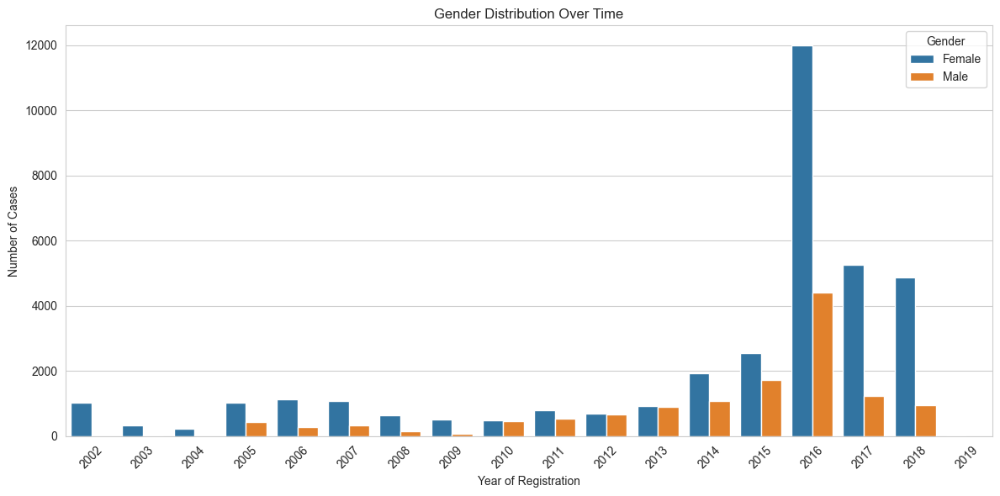

In [14]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='yearOfRegistration', hue='gender')
plt.title("Gender Distribution Over Time")
plt.xlabel("Year of Registration")
plt.ylabel("Number of Cases")
plt.xticks(rotation=45)
plt.legend(title="Gender")
plt.tight_layout()
plt.show()

Females are consistently the majority.
Male victim reporting increases from 2010 onward.
2016 shows a historic peak for both genders, but females still dominate (huge difference)

The spike in human trafficking cases, especially after 2010, was likely caused by better reporting, expanded legal definitions to include forced labour and other exploitations, and major global migration crises. These changes also led to more visibility of male victims, although females remained the majority

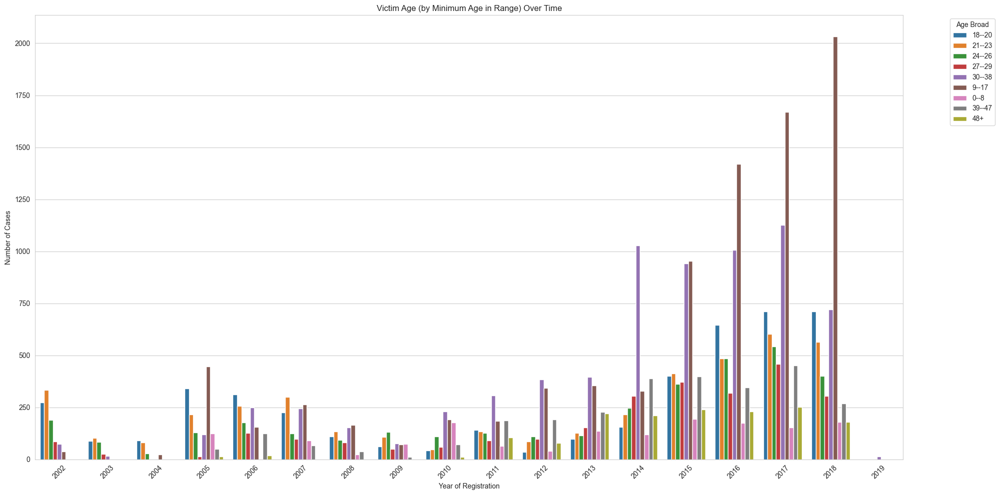

In [15]:
plt.figure(figsize=(20, 10))
sns.countplot(
    data=df.dropna(subset=['ageBroad']),
    x='yearOfRegistration',
    hue='ageBroad',
    palette='tab10'
)
plt.title("Victim Age (by Minimum Age in Range) Over Time")
plt.xlabel("Year of Registration")
plt.ylabel("Number of Cases")
plt.xticks(rotation=45)
plt.legend(title="Age Broad", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()



victims aged 9–17 increasingly became the largest group in human trafficking cases, especially after 2014, suggesting a worrying rise in child exploitation. Adult groups (18–38) also grew, but at a slower pace compared to minors

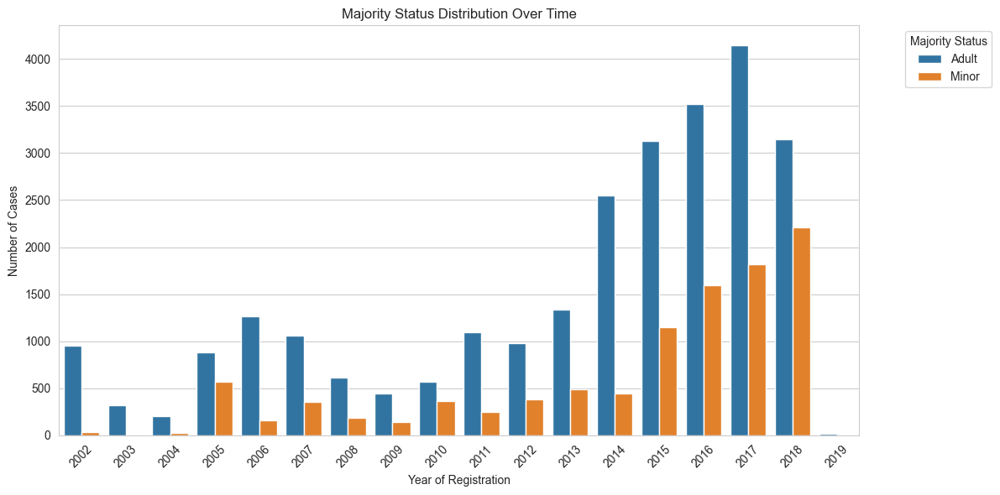

In [16]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df.dropna(subset=['majorityStatus']), x='yearOfRegistration', hue='majorityStatus')
plt.title("Majority Status Distribution Over Time")
plt.xlabel("Year of Registration")
plt.ylabel("Number of Cases")
plt.xticks(rotation=45)
plt.legend(title="Majority Status", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

even though it contradicts previous comments, it is reasonable that adults cases are highers since the range of age is bigger than minors.

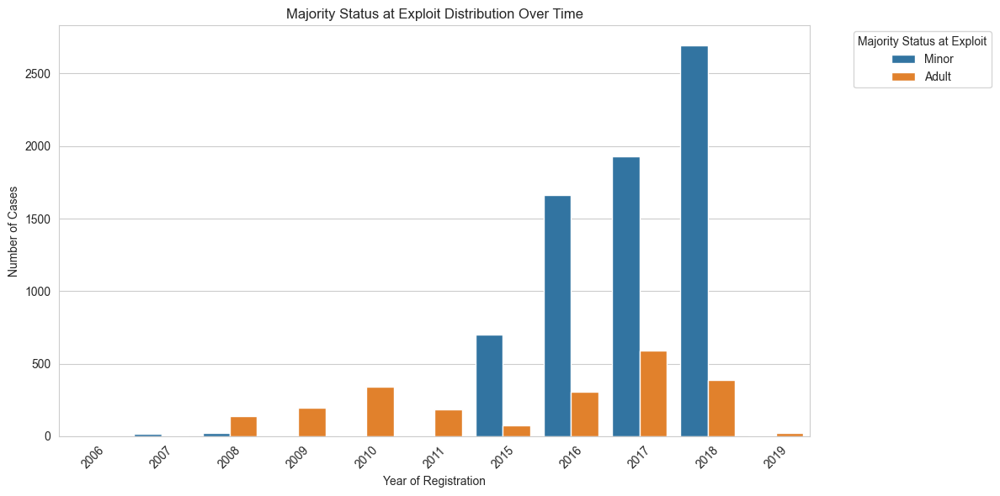

In [17]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df.dropna(subset=['majorityStatusAtExploit']), x='yearOfRegistration', hue='majorityStatusAtExploit')
plt.title("Majority Status at Exploit Distribution Over Time")
plt.xlabel("Year of Registration")
plt.ylabel("Number of Cases")
plt.xticks(rotation=45)
plt.legend(title="Majority Status at Exploit", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

** this is weird. why are more minors at the time of exploitation if when trafficked there were more adults? some people were trafficked when they were adults, but others were trafficked when they were kids and even if fewer kids were trafficked at first, they stayed trapped for longer and got exploited more.
Also, after a while, traffickers started focusing more on minors because they were easier to control and there was more demand

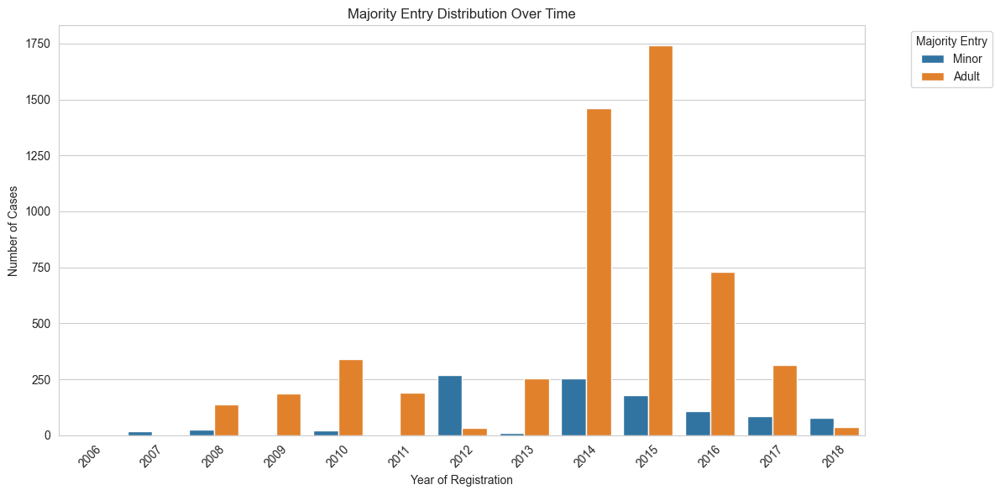

In [18]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df.dropna(subset=['majorityEntry']), x='yearOfRegistration', hue='majorityEntry')
plt.title("Majority Entry Distribution Over Time")
plt.xlabel("Year of Registration")
plt.ylabel("Number of Cases")
plt.xticks(rotation=45)
plt.legend(title="Majority Entry", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

fewer cases than it should. why at the entry there so little but for the normal distributions theres way. however the distirbution seems pretty similar despite the lack of info.

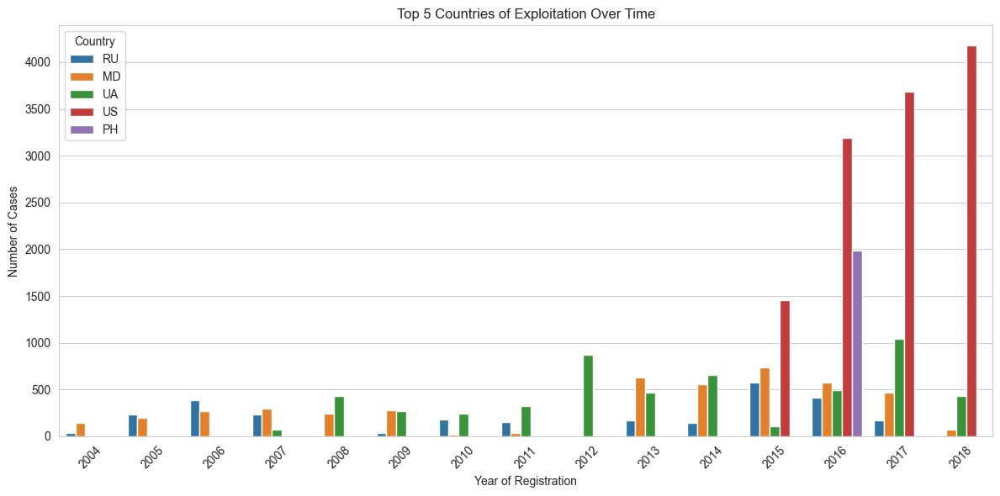

In [19]:
top_countries = df['CountryOfExploitation'].value_counts().head(5).index.tolist()

plt.figure(figsize=(12, 6))
sns.countplot(data=df[df['CountryOfExploitation'].isin(top_countries)], 
              x='yearOfRegistration', hue='CountryOfExploitation')
plt.title("Top 5 Countries of Exploitation Over Time")
plt.xlabel("Year of Registration")
plt.ylabel("Number of Cases")
plt.xticks(rotation=45)
plt.legend(title="Country")
plt.tight_layout()
plt.show()


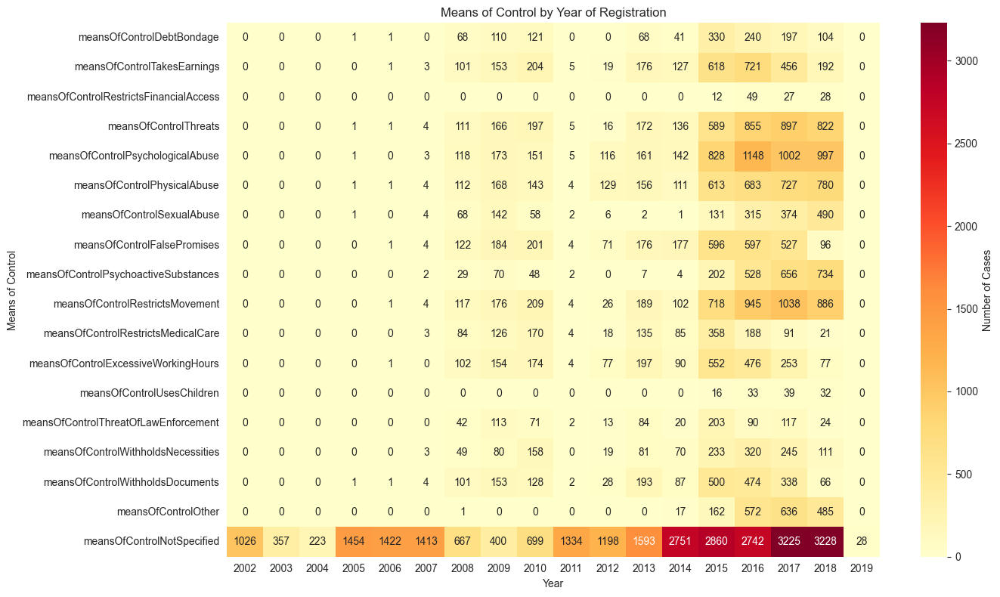

In [20]:
means_of_control_cols = [
    'meansOfControlDebtBondage',
    'meansOfControlTakesEarnings',
    'meansOfControlRestrictsFinancialAccess',
    'meansOfControlThreats',
    'meansOfControlPsychologicalAbuse',
    'meansOfControlPhysicalAbuse',
    'meansOfControlSexualAbuse',
    'meansOfControlFalsePromises',
    'meansOfControlPsychoactiveSubstances',
    'meansOfControlRestrictsMovement',
    'meansOfControlRestrictsMedicalCare',
    'meansOfControlExcessiveWorkingHours',
    'meansOfControlUsesChildren',
    'meansOfControlThreatOfLawEnforcement',
    'meansOfControlWithholdsNecessities',
    'meansOfControlWithholdsDocuments',
    'meansOfControlOther',
    'meansOfControlNotSpecified'
]

# Aggregate
yearly = df.groupby('yearOfRegistration')[means_of_control_cols].sum()

# Plot heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(yearly.T, annot=True, fmt='g', cmap='YlOrRd', cbar_kws={'label': 'Number of Cases'})
plt.title('Means of Control by Year of Registration')
plt.xlabel('Year')
plt.ylabel('Means of Control')
plt.tight_layout()
plt.show()






After 2013, there was a sharp rise in recorded human trafficking cases, especially for psychological abuse, threats, restricts movement, and excessive working hours, which became the most prominent means of control; this likely reflects improved reporting practices, legal changes, or greater awareness. Earlier years mostly recorded "Not Specified" means of control, and the sudden drop in 2019 likely indicates incomplete data collection mentioned previously.

##### more detailed code for means of control for each year of registration

In [21]:
# Aggregate
yearly = df.groupby('yearOfRegistration')[means_of_control_cols].sum().reset_index()

# Create traces for each control
fig = go.Figure()

for control in means_of_control_cols:
    fig.add_trace(
        go.Bar(x=yearly['yearOfRegistration'], y=yearly[control], name=control, visible=False)
    )

# Make first one visible
fig.data[0].visible = True

# Dropdown buttons
buttons = []
for i, control in enumerate(means_of_control_cols):
    visible = [False] * len(means_of_control_cols)
    visible[i] = True
    buttons.append(
        dict(label=control,
             method='update',
             args=[{'visible': visible},
                   {'title': f'Means of Control: {control}'}])
    )

# Layout
fig.update_layout(
    updatemenus=[dict(active=0, buttons=buttons, x=1.05)],
    title='Means of Control: ' + means_of_control_cols[0],
    xaxis_title='Year of Registration',
    yaxis_title='Number of Cases'
)

fig.show()



** maybe for amjority status i have to check it's not redundant with the age range, cuz maybe we have to drop it since its repeptitive information.

#### Datasource

In [22]:
df[['Datasource']].info()
df['Datasource'].value_counts()
df[['Datasource']].isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48801 entries, 0 to 48800
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Datasource  48801 non-null  object
dtypes: object(1)
memory usage: 381.4+ KB


Datasource    0
dtype: int64

Case Management:
- More detailed data: professionals collect structured information, often after spending time with the victim.

- Bias toward detected victims: they usually records only people who have already been rescued or identified. Not hidden cases.
- Longer time gap: cases might get registered months or even years after trafficking happened 

Hotline Reports
- Real-time reporting: very fresh data, closer to when the trafficking is happening.
- More diverse cases: includes hidden populations who would not go to authorities.

- Incomplete data: people may only give partial info
- More unverified: it's hard to confirm what really happened from just a call.
- Misclassification risk: a caller might mistake a bad labor practice for trafficking, or vice versa.

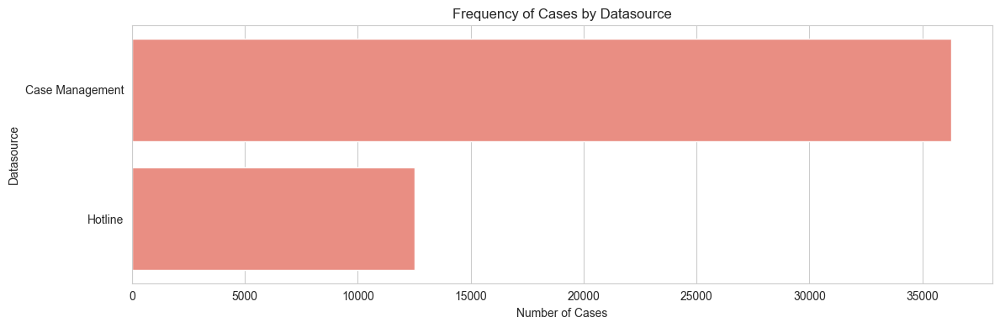

In [23]:
plt.figure(figsize=(12, 4))
sns.countplot(data=df, y='Datasource', order=df['Datasource'].value_counts().index, color='salmon')
plt.title("Frequency of Cases by Datasource")
plt.xlabel("Number of Cases")
plt.ylabel("Datasource")
plt.tight_layout()
plt.show()

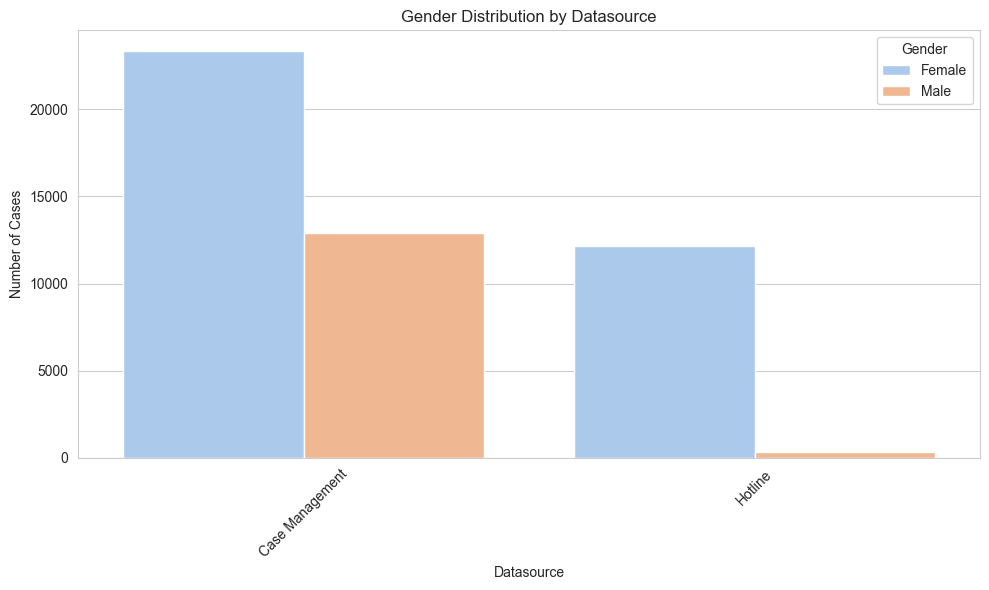

In [24]:
# Drop missing values for relevant columns
df_gender = df.dropna(subset=['Datasource', 'gender'])

# Plot
plt.figure(figsize=(10, 6))
sns.countplot(data=df_gender, x='Datasource', hue='gender', palette='pastel')

# Customize
plt.title("Gender Distribution by Datasource")
plt.xlabel("Datasource")
plt.ylabel("Number of Cases")
plt.xticks(rotation=45)
plt.legend(title="Gender")
plt.tight_layout()
plt.show()


The high amoount of females cases in the different datasource outstanding male cases probabibly is due to the high amount of female cases in general. However, we can see that females are more present in the case management maybe due to the repeated and longer exploitation, also the reason why the female cases in hotline are higher than male might be because the type of exploitation is not as open as the one present in males. For example is more difficult to talk in person about sexual exploitation rather than labour exploitation as well as the urgency of these types. Males might be more involved in a long term exploitation.


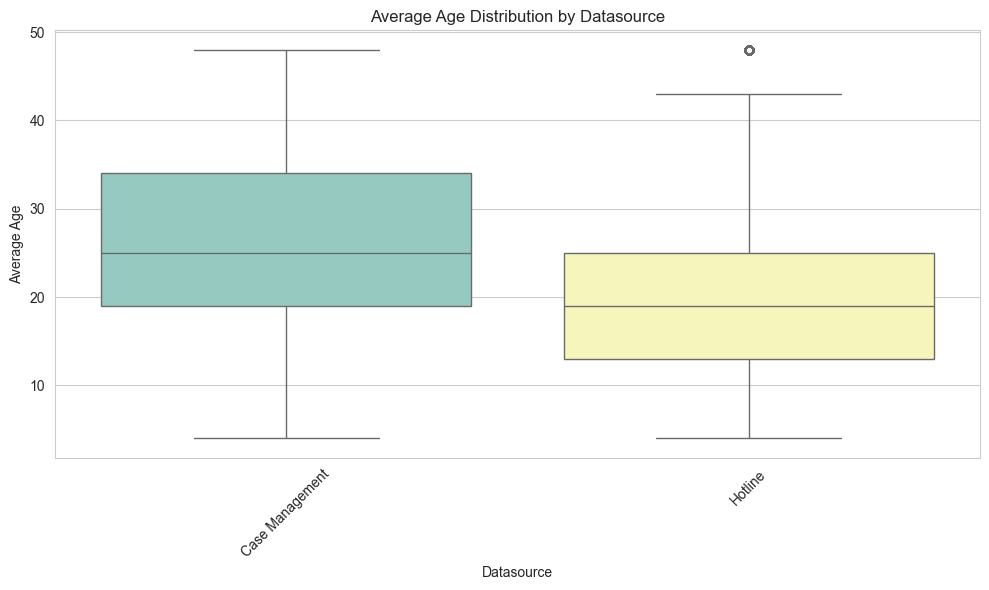

In [25]:

df[['age_min', 'age_max']] = df['ageBroad'].str.extract(r'(\d+)[^\d]*(\d+)?').astype(float)
df['age_avg'] = df[['age_min', 'age_max']].mean(axis=1)

# Drop rows where age or datasource is missing
df_age = df.dropna(subset=['Datasource', 'age_avg'])

# Plot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Datasource', y='age_avg', hue='Datasource', palette='Set3', legend=False)

# Customize
plt.title("Average Age Distribution by Datasource")
plt.xlabel("Datasource")
plt.ylabel("Average Age")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Hotline cases usually involve younger people because they are often reported while the trafficking is still happening or just ended. These reports can come from the victims themselves, someone who saw something, or emergency workers. Since Hotline calls are about urgent situations, people are often identified and helped at a younger age.

Case Management data shows older ages because it involves helping people after some time has passed since the trafficking. These victims might be referred by another organization or ask for help later, sometimes years after the exploitation happened. So, the age we see is when they started getting support, not when the trafficking happened. That's why Case Management cases often show older ages.

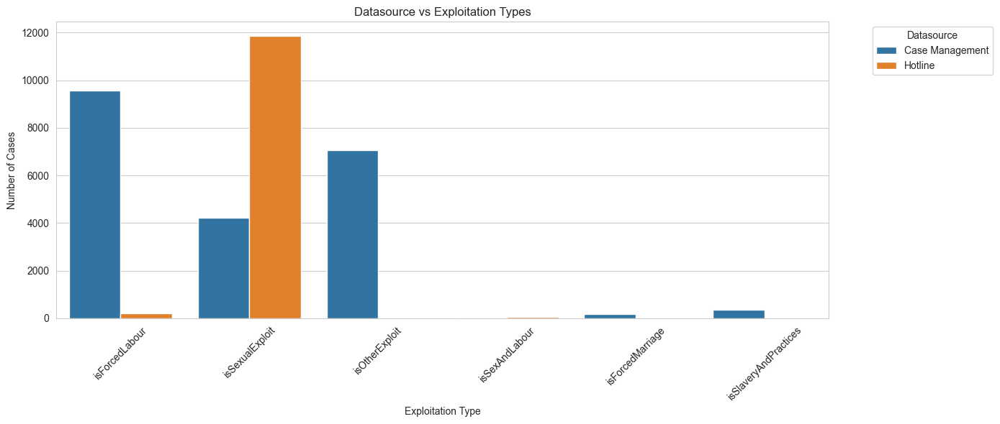

In [26]:
exploitation_cols = [
    'isForcedLabour', 'isSexualExploit', 'isOtherExploit', 'isSexAndLabour', 
    'isForcedMarriage', 'isForcedMilitary', 'isOrganRemoval', 'isSlaveryAndPractices'
]

# Melt for plotting
df_exploit = df[['Datasource'] + exploitation_cols].melt(id_vars='Datasource',
                                                         var_name='ExploitType',
                                                         value_name='Presence')

# Filter where exploitation is present (value == 1)
df_exploit = df_exploit[df_exploit['Presence'] == 1]

# Plot
plt.figure(figsize=(14, 6))
sns.countplot(data=df_exploit, x='ExploitType', hue='Datasource')
plt.title("Datasource vs Exploitation Types")
plt.xlabel("Exploitation Type")
plt.ylabel("Number of Cases")
plt.xticks(rotation=45)
plt.legend(title="Datasource", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()



Again, here we can see that hotline catches more urgent cases as clearly show in the sexual explotation type, while case management cases tends to involve more long term cases such as forced labour. Also we can see that case management deal with a wider number of exploitation types.

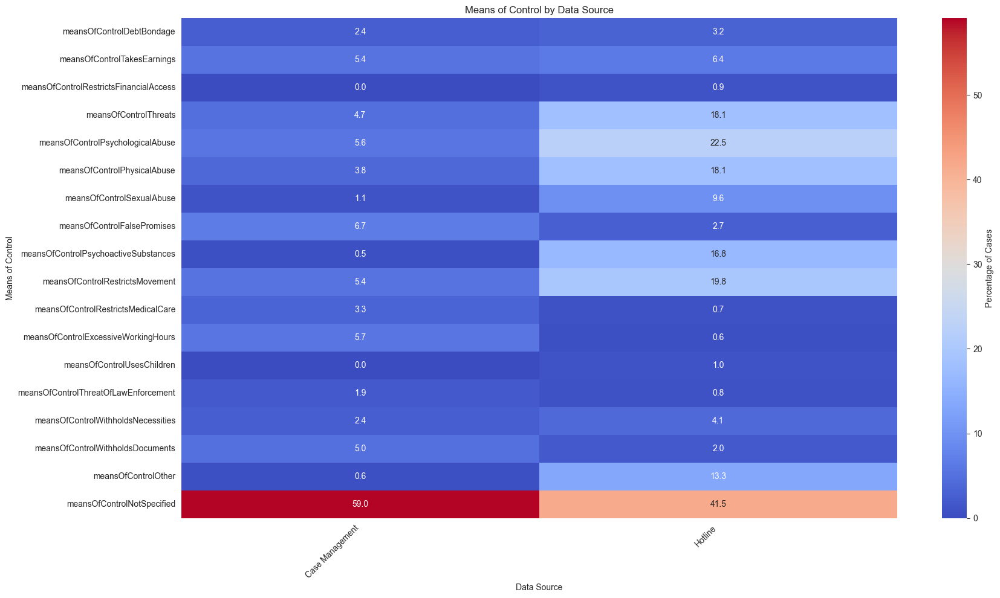

In [27]:
# Count how many cases exist per datasource
source_counts = df['Datasource'].value_counts()

# Now calculate the correct percentage for each means of control
heatmap_data = {}

for control in means_of_control_cols:
    counts = df.groupby('Datasource')[control].sum()  # Sum where control was 1
    percentages = counts / source_counts * 100         # Calculate % over total cases in that source
    heatmap_data[control] = percentages

# Create a DataFrame
heatmap_df = pd.DataFrame(heatmap_data).T  # transpose to get controls as rows

# Plot the heatmap
plt.figure(figsize=(18, 10))
sns.heatmap(heatmap_df, annot=True, fmt=".1f", cmap="coolwarm", cbar_kws={'label': 'Percentage of Cases'})
plt.title('Means of Control by Data Source')
plt.xlabel('Data Source')
plt.ylabel('Means of Control')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


Datasource can affect how the means of control appear in the data because each source captures it in different ways. In here we can see that physical or physcological abuse or smilar types of means are more prominent in hotline probabily because they might want to report something urgent and that are easy to idenity quickly. While case management may capture more detailed or complex control methods over time, but they might not be as immediately visible.

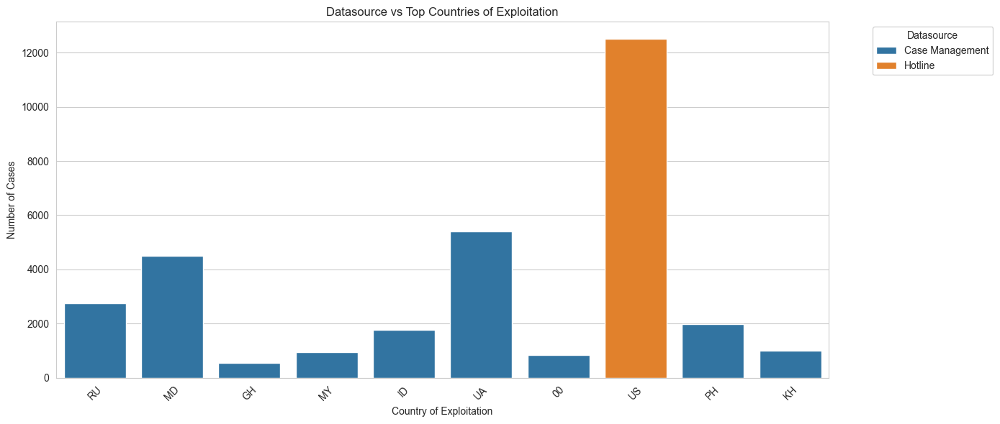

In [28]:
# Top 10 countries for visibility
top_countries = df['CountryOfExploitation'].value_counts().head(10).index

plt.figure(figsize=(14, 6))
sns.countplot(data=df[df['CountryOfExploitation'].isin(top_countries)], 
              x='CountryOfExploitation', hue='Datasource')
plt.title("Datasource vs Top Countries of Exploitation")
plt.xlabel("Country of Exploitation")
plt.ylabel("Number of Cases")
plt.xticks(rotation=45)
plt.legend(title="Datasource", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


pretty interesting that for each country there's only one type of data source not both. This likely reflects how different data sources operate in different regions. This shows that the type of datasource can influence not just what data is collected, but also where it's collected. Should check why us has only hotline datasource, is it the only way of doing?

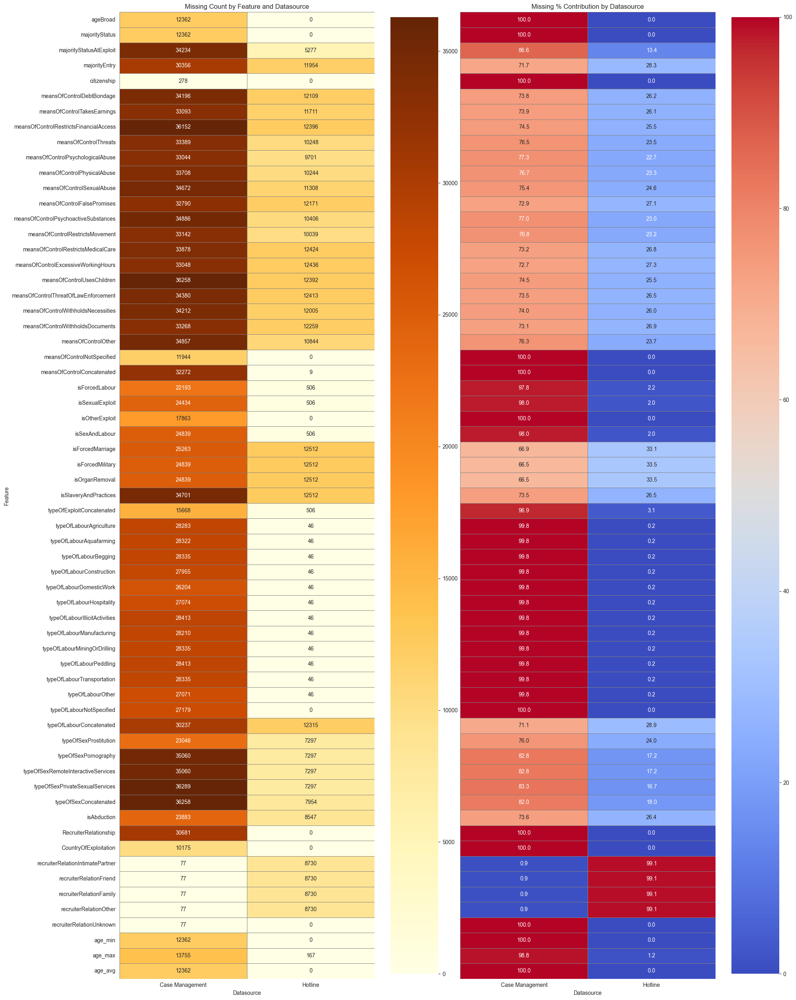

In [29]:
# Step 1: Identify columns with missing values (excluding 'Datasource')
features_with_missing = df.columns[df.isna().sum() > 0]
features_with_missing = [col for col in features_with_missing if col != 'Datasource']

# Step 2: Subset of missing + 'Datasource'
df_missing = df[features_with_missing + ['Datasource']]

# Step 3: Missing counts per datasource (no warning now)
missing_counts = (
    df_missing
    .groupby('Datasource')
    .apply(lambda group: group[features_with_missing].isna().sum(), include_groups=False)
    .T
)

# Step 4a: Absolute missing values
missing_summary = missing_counts.loc[missing_counts.sum(axis=1) > 0]

# Step 4b: Percentage of missing values
total_missing = missing_counts.sum(axis=1)
missing_percent = (missing_counts.T / total_missing).T * 100

# Step 5: Plot both heatmaps side by side
fig, axes = plt.subplots(1, 2, figsize=(20, len(missing_summary) * 0.4), sharey=True)

# Left: absolute values
sns.heatmap(missing_summary, ax=axes[0], annot=True, fmt="d", cmap="YlOrBr",
            linewidths=0.5, linecolor='gray')
axes[0].set_title("Missing Count by Feature and Datasource")
axes[0].set_xlabel("Datasource")
axes[0].set_ylabel("Feature")

# Right: percentage values
sns.heatmap(missing_percent, ax=axes[1], annot=True, fmt=".1f", cmap="coolwarm",
            linewidths=0.5, linecolor='gray')
axes[1].set_title("Missing % Contribution by Datasource")
axes[1].set_xlabel("Datasource")
axes[1].set_ylabel("")

plt.tight_layout()
plt.show()



In general there should be more missing values when the datasource is hotline since it's really hard to catch all the information just by a call, however we can see that in casemanagement most of the features have a lot of missing values, maybe due to the amount of caases comapred to hotline. Another reason could that hotline is a more recent approach which means that data colleciton is better. What we can say about these two is that when the information it's too detailed both of them seems not to catch them very well.

### 2.1.1 Victim Demographics

#### gender: one of the main predictors

In [30]:
df[['gender']].info()
print(df['gender'].value_counts())
print(df[['gender']].isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48801 entries, 0 to 48800
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   gender  48801 non-null  object
dtypes: object(1)
memory usage: 381.4+ KB
gender
Female    35534
Male      13267
Name: count, dtype: int64
gender    0
dtype: int64


In [31]:
# Count occurrences of each gender
gender_counts = df['gender'].value_counts().reset_index()
gender_counts.columns = ['Gender', 'Count']

# Bar plot with Plotly
fig = px.bar(
    gender_counts,
    x='Gender',
    y='Count',
    text='Count',
    title='Gender Distribution',
    color='Gender',
    color_discrete_sequence=px.colors.qualitative.Pastel
)
fig.update_traces(textposition='outside')
fig.update_layout(xaxis_title='Gender', yaxis_title='Count', xaxis_tickangle=-30)
fig.show()


Females cases are higher than man, might be because:
- the majority of human trafficking cases are related to sexual exploitation, and also there is a higher "demand" for females in this business making them more likely to be trafficked (sounds really bad and unethical though)
- women are often more vulnerable due to gender inequality as well as they face more violence and discrimination which makes them more likely to be trafficked. 
- Depending on each country, women may have fewer opportunities making them easier targets.
- in many societies, there are beliefs that women are objects to be controlled, which can make it easier for traffickers to exploit them. Women might also be less likely to report their trafficking because of shame or fear of being blamed, so traffickers take advantage of that
- there are likely more male victims than we see, but these cases are less reported. Male trafficking often involves forced labor in things like construction or farming, which doesn’t get as much attention as sexual exploitation
- there is more awareness in female human trafficking which makes reporting them better

#### ageBroad: one of the main predictors

In [32]:
df[['ageBroad']].info()
print(df['ageBroad'].value_counts())
print(df[['ageBroad']].isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48801 entries, 0 to 48800
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   ageBroad  36439 non-null  object
dtypes: object(1)
memory usage: 381.4+ KB
ageBroad
9--17     8645
30--38    7091
18--20    4448
21--23    4213
24--26    3464
39--47    2821
27--29    2641
48+       1560
0--8      1556
Name: count, dtype: int64
ageBroad    12362
dtype: int64


In [33]:
# Set the desired order for the categories in ageBroad
age_order = ['0--8', '9--17', '18--20', '21--23', '24--26', '27--29', '30--38', '39--47', '48+']
df['ageBroad'] = pd.Categorical(df['ageBroad'], categories=age_order, ordered=True)

# Plot using Plotly Express
fig = px.histogram(
    df,
    x='ageBroad',
    category_orders={'ageBroad': age_order},
    title='Age Distribution (ageBroad)',
    color='ageBroad',
    color_discrete_sequence=px.colors.qualitative.Pastel
)

fig.update_layout(
    xaxis_title='Age Group',
    yaxis_title='Count',
    xaxis_tickangle=45,
    showlegend=False
)
fig.show()


In [34]:
# Ensure 'ageBroad' is ordered categorically
age_order = ['0--8', '9--17', '18--20', '21--23', '24--26', '27--29', '30--38', '39--47', '48+']
df['ageBroad'] = pd.Categorical(df['ageBroad'], categories=age_order, ordered=True)

# Drop NaNs for plotting
df_age = df.dropna(subset=['ageBroad', 'gender'])

# Create grouped bar chart
fig = px.histogram(
    df_age,
    x='ageBroad',
    color='gender',
    category_orders={'ageBroad': age_order},
    barmode='group',
    title='Age Group Distribution by Gender',
    color_discrete_sequence=px.colors.qualitative.Pastel
)

fig.update_layout(
    xaxis_title='Age Group',
    yaxis_title='Count',
    xaxis_tickangle=45,
    bargap=0.2
)

fig.show()


#### majorityStatus, majorityStatusAtExploit, majorityEntry

In [35]:
df[['majorityStatus', 'majorityStatusAtExploit', 'majorityEntry']].info()
print(df[['majorityStatus', 'majorityStatusAtExploit', 'majorityEntry']].value_counts())
print(df[['majorityStatus', 'majorityStatusAtExploit', 'majorityEntry']].isnull().sum())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48801 entries, 0 to 48800
Data columns (total 3 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   majorityStatus           36439 non-null  object
 1   majorityStatusAtExploit  9290 non-null   object
 2   majorityEntry            6491 non-null   object
dtypes: object(3)
memory usage: 1.1+ MB
majorityStatus  majorityStatusAtExploit  majorityEntry
Adult           Adult                    Adult            922
                Minor                    Adult            194
Minor           Minor                    Minor            187
Adult           Minor                    Minor            116
                Adult                    Minor              7
Minor           Minor                    Adult              3
Name: count, dtype: int64
majorityStatus             12362
majorityStatusAtExploit    39511
majorityEntry              42310
dtype: int64


The inconsistencies, like someone being marked as an "Adult" in majorityStatus but as a "Minor" in majorityStatusAtExploit, might be due to data entry errors, differences in how "Adult" and "Minor" are defined legally, or incomplete information. Missing values in majorityStatusAtExploit and majorityEntry could be because of gaps in data collection or privacy concerns. It's also possible that complex cases, like people being exploited across different countries or having changing ages during exploitation, cause these differences.

In [36]:
majority_status_counts = df['majorityStatus'].value_counts().reset_index()
majority_status_counts.columns = ['Majority Status', 'Count']

fig = px.bar(
    majority_status_counts,
    x='Majority Status',
    y='Count',
    text='Count',
    title='Distribution of Majority Status',
    color='Majority Status',
    color_discrete_sequence=px.colors.qualitative.Bold
)
fig.update_traces(textposition='outside')
fig.update_layout(xaxis_tickangle=-30)
fig.show()



In [37]:
at_exploit_counts = df['majorityStatusAtExploit'].value_counts().reset_index()
at_exploit_counts.columns = ['Majority Status at Exploitation', 'Count']

fig = px.bar(
    at_exploit_counts,
    x='Majority Status at Exploitation',
    y='Count',
    text='Count',
    title='Distribution of Majority Status at Exploitation',
    color='Majority Status at Exploitation',
    color_discrete_sequence=px.colors.qualitative.Set1
)
fig.update_traces(textposition='outside')
fig.update_layout(xaxis_tickangle=-30)
fig.show()


In [38]:
entry_counts = df['majorityEntry'].value_counts().reset_index()
entry_counts.columns = ['Majority Status at Entry', 'Count']

fig = px.bar(
    entry_counts,
    x='Majority Status at Entry',
    y='Count',
    text='Count',
    title='Distribution of Majority Status at Entry',
    color='Majority Status at Entry',
    color_discrete_sequence=px.colors.qualitative.Dark2
)
fig.update_traces(textposition='outside')
fig.update_layout(xaxis_tickangle=-30)
fig.show()



In [39]:
fig = px.histogram(df, x='majorityStatus', color='gender', barmode='group', title='Majority Status by Gender')
fig.show()

fig = px.histogram(df, x='majorityStatusAtExploit', color='gender', barmode='group', title='Majority Status at Time of Exploitation by Gender')
fig.show()

fig = px.histogram(df, x='majorityEntry', color='gender', barmode='group', title='Majority Status at Entry by Gender')
fig.show()

#### citizenship: one of the main predictors 

In [40]:
df[['citizenship']].info()
print(df['citizenship'].value_counts())
print(df[['citizenship']].isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48801 entries, 0 to 48800
Data columns (total 1 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   citizenship  48523 non-null  object
dtypes: object(1)
memory usage: 381.4+ KB
citizenship
PH    11365
00     8858
UA     7761
MD     5901
US     3636
KH     1979
ID     1971
BY     1463
MM     1250
RO      655
GH      544
KG      437
BG      342
HT      339
UZ      261
VN      170
GW      145
LA      126
CO      124
NG      108
UG       98
AF       97
MG       94
LK       85
SL       81
SN       70
TH       55
KZ       54
CD       53
ML       45
TJ       43
BF       33
KE       32
CI       31
NE       31
NP       27
TM       26
CN       23
AL       22
MX       19
BO       18
GN       15
ER       13
KR       12
BD       11
Name: count, dtype: int64
citizenship    278
dtype: int64


In [41]:
# Create a mapping from ISO alpha-2 codes to full country names
def code_to_country(code):
    try:
        if pd.isna(code) or code == '00':
            return 'Unknown'
        return pycountry.countries.get(alpha_2=code).name
    except:
        return 'Unknown'

# Apply the mapping
df['citizenship_country'] = df['citizenship'].apply(code_to_country)

# Count occurrences
country_counts = df['citizenship_country'].value_counts().reset_index()
country_counts.columns = ['country', 'count']

# Plot the choropleth map
fig = px.choropleth(country_counts,
                    locations="country",
                    locationmode="country names",
                    color="count",
                    title="Cases by Citizenship Country",
                    color_continuous_scale=px.colors.sequential.Plasma)

fig.show()

In [42]:
# Get top 10 citizenships
top_countries = df['citizenship'].value_counts().head(10).index
df_citizen = df[df['citizenship'].isin(top_countries)]

# Group and count
citizen_counts = df_citizen.groupby(['citizenship', 'gender']).size().reset_index(name='count')

# Plot
fig_citizen = px.bar(
    citizen_counts,
    x='citizenship',
    y='count',
    color='gender',
    barmode='group',
    title='Top 10 Citizenship Countries by Gender',
    text='count',
    color_discrete_sequence=px.colors.qualitative.Pastel
)

fig_citizen.update_layout(xaxis_title='Citizenship', yaxis_title='Count', xaxis_tickangle=45)
fig_citizen.update_traces(textposition='outside')
fig_citizen.show()


In [43]:

# Define age order again if not set
age_order = ['0--8', '9--17', '18--20', '21--23', '24--26', '27--29', '30--38', '39--47', '48+']
df['ageBroad'] = pd.Categorical(df['ageBroad'], categories=age_order, ordered=True)

# Get top 10 citizenships
top_countries = df['citizenship'].value_counts().head(10).index

# Plot
fig_citizenship = px.histogram(
    df[df['citizenship'].isin(top_countries)],
    x='citizenship',
    color='ageBroad',
    title='Top Citizenship by Age Group',
    category_orders={'ageBroad': age_order},
    color_discrete_sequence=px.colors.qualitative.Pastel,
    barmode='group'
)
fig_citizenship.update_layout(xaxis_tickangle=45)
fig_citizenship.show()


In [44]:
top_countries = df['citizenship'].value_counts().nlargest(10).index
df_top_countries = df[df['citizenship'].isin(top_countries)]

fig = px.histogram(df_top_countries, x='citizenship', color='typeOfExploitConcatenated',
                   title='Citizenship vs Type of Exploitation',
                   labels={'citizenship': 'Citizenship'},
                   barmode='group')
fig.show()


### 2.1.2 Means of Control

In [45]:
# Define all means of control columns
control_cols = [
    'meansOfControlDebtBondage', 'meansOfControlTakesEarnings', 'meansOfControlRestrictsFinancialAccess',
    'meansOfControlThreats', 'meansOfControlPsychologicalAbuse', 'meansOfControlPhysicalAbuse',
    'meansOfControlSexualAbuse', 'meansOfControlFalsePromises', 'meansOfControlPsychoactiveSubstances',
    'meansOfControlRestrictsMovement', 'meansOfControlRestrictsMedicalCare', 'meansOfControlExcessiveWorkingHours',
    'meansOfControlUsesChildren', 'meansOfControlThreatOfLawEnforcement', 'meansOfControlWithholdsNecessities',
    'meansOfControlWithholdsDocuments', 'meansOfControlOther', 'meansOfControlNotSpecified'
]

# Subset the DataFrame
df_means = df[control_cols]

# Basic info
df_means.info()

# Missing values per column
print("\nMissing Values:")
print(df_means.isnull().sum())

# Value counts for each means of control
print("\nValue Counts for Each Means of Control Column:")
for col in means_of_control_cols:
    print(f"\n{col} value counts:")
    print(df[col].value_counts(dropna=False))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48801 entries, 0 to 48800
Data columns (total 18 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   meansOfControlDebtBondage               2496 non-null   float64
 1   meansOfControlTakesEarnings             3997 non-null   float64
 2   meansOfControlRestrictsFinancialAccess  253 non-null    float64
 3   meansOfControlThreats                   5164 non-null   float64
 4   meansOfControlPsychologicalAbuse        6056 non-null   float64
 5   meansOfControlPhysicalAbuse             4849 non-null   float64
 6   meansOfControlSexualAbuse               2821 non-null   float64
 7   meansOfControlFalsePromises             3840 non-null   float64
 8   meansOfControlPsychoactiveSubstances    3509 non-null   float64
 9   meansOfControlRestrictsMovement         5620 non-null   float64
 10  meansOfControlRestrictsMedicalCare      2499 non-null   fl

In [46]:
# Shortened names for means of control
short_names = {
    'meansOfControlDebtBondage': 'Debt Bondage',
    'meansOfControlTakesEarnings': 'Takes Earnings',
    'meansOfControlRestrictsFinancialAccess': 'Restricts Financial Access',
    'meansOfControlThreats': 'Threats',
    'meansOfControlPsychologicalAbuse': 'Psychological Abuse',
    'meansOfControlPhysicalAbuse': 'Physical Abuse',
    'meansOfControlSexualAbuse': 'Sexual Abuse',
    'meansOfControlFalsePromises': 'False Promises',
    'meansOfControlPsychoactiveSubstances': 'Psychoactive Substances',
    'meansOfControlRestrictsMovement': 'Restricts Movement',
    'meansOfControlRestrictsMedicalCare': 'Restricts Medical Care',
    'meansOfControlExcessiveWorkingHours': 'Excessive Working Hours',
    'meansOfControlUsesChildren': 'Uses Children',
    'meansOfControlThreatOfLawEnforcement': 'Threat of Law Enforcement',
    'meansOfControlWithholdsNecessities': 'Withholds Necessities',
    'meansOfControlWithholdsDocuments': 'Withholds Documents',
    'meansOfControlOther': 'Other',
    'meansOfControlNotSpecified': 'Not Specified'
}


# Create a new DataFrame that will contain the counts for each means of control
df_control = df[control_cols].sum(axis=0).reset_index()
df_control.columns = ['Control_Type', 'Case_Count']

# Shorten the names
df_control['Control_Type'] = df_control['Control_Type'].map(short_names)

# Create the bar plot using Plotly Express
fig = px.bar(df_control, 
             x='Control_Type', 
             y='Case_Count', 
             title='Count of Cases for Each Means of Control', 
             labels={'Control_Type': 'Means of Control', 'Case_Count': 'Case Count'},
             color='Case_Count', 
             color_continuous_scale='Viridis')

# Rotate the x-axis labels for better readability
fig.update_layout(xaxis_tickangle=45)

fig.show()


In [47]:
# List of columns related to means of control (excluding concatenated versions)
control_cols = [
    col for col in df.columns
    if col.startswith('meansOfControl') and col != 'meansOfControlConcatenated'
]


# Melt the dataframe to long format for each means of control
df_control = df.melt(id_vars='gender', value_vars=control_cols,
                     var_name='Control_Type', value_name='Present')

# Filter rows where the control type is marked present (value == 1)
df_control = df_control[df_control['Present'] == 1]

# Replace control types with shortened names
df_control['Control_Type'] = df_control['Control_Type'].replace(short_names)

# Plot using Plotly Express
fig = px.histogram(df_control, x='Control_Type', color='gender',
                   barmode='group', color_discrete_sequence=px.colors.qualitative.Pastel)

fig.update_layout(
    title='Means of Control by Gender',
    xaxis_title='Means of Control',
    yaxis_title='Number of Cases',
    xaxis_tickangle=45
)

fig.show()


In [48]:
means_of_control_cols = [
    'meansOfControlDebtBondage', 'meansOfControlTakesEarnings',
    'meansOfControlRestrictsFinancialAccess', 'meansOfControlThreats',
    'meansOfControlPsychologicalAbuse', 'meansOfControlPhysicalAbuse',
    'meansOfControlSexualAbuse', 'meansOfControlFalsePromises',
    'meansOfControlPsychoactiveSubstances', 'meansOfControlRestrictsMovement',
    'meansOfControlRestrictsMedicalCare', 'meansOfControlExcessiveWorkingHours',
    'meansOfControlUsesChildren', 'meansOfControlThreatOfLawEnforcement',
    'meansOfControlWithholdsNecessities', 'meansOfControlWithholdsDocuments',
    'meansOfControlOther', 'meansOfControlNotSpecified'
]

# Ensure ageBroad is present
df_moc_age = df[means_of_control_cols + ['ageBroad']].copy()
df_moc_age = df_moc_age.dropna(subset=['ageBroad'])

# Melt to long format
df_long_moc_age = df_moc_age.melt(id_vars='ageBroad',
                                  value_vars=means_of_control_cols,
                                  var_name='Means of Control',
                                  value_name='MOC Present')

# Filter where means of control is present
df_long_moc_age = df_long_moc_age[df_long_moc_age['MOC Present'] == 1]

# Clean labels
df_long_moc_age['Means of Control'] = df_long_moc_age['Means of Control'].str.replace('meansOfControl', '')
df_long_moc_age['Means of Control'] = df_long_moc_age['Means of Control'].str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)

# Group and count
grouped_moc_age = df_long_moc_age.groupby(['Means of Control', 'ageBroad']).size().reset_index(name='Count')

# Plot
fig2 = px.bar(grouped_moc_age,
              x='ageBroad',
              y='Count',
              color='Means of Control',
              barmode='group',
              title='Age Group vs. Means of Control')

fig2.update_layout(xaxis_title='Age Group', yaxis_title='Count', xaxis_tickangle=-30)
fig2.show()


### 2.1.3 Type of Exploitation

In [49]:
exploit_cols = [
    'isForcedLabour', 'isSexualExploit', 'isOtherExploit',
    'isSexAndLabour', 'isForcedMarriage', 'isForcedMilitary',
    'isOrganRemoval', 'isSlaveryAndPractices'
]

# Subset the DataFrame
df_exploit = df[exploit_cols]

# Basic info
df_exploit.info()

# Missing values per column
print("\nMissing Values:")
print(df_exploit.isnull().sum())

# Value counts for each type of exploitation column
print("\nValue Counts for Each Exploitation Column:")
for col in exploit_cols:
    print(f"\n{col} value counts:")
    print(df[col].value_counts(dropna=False))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48801 entries, 0 to 48800
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   isForcedLabour         26102 non-null  float64
 1   isSexualExploit        23861 non-null  float64
 2   isOtherExploit         30938 non-null  float64
 3   isSexAndLabour         23456 non-null  float64
 4   isForcedMarriage       11026 non-null  float64
 5   isForcedMilitary       11450 non-null  float64
 6   isOrganRemoval         11450 non-null  float64
 7   isSlaveryAndPractices  1588 non-null   float64
dtypes: float64(8)
memory usage: 3.0 MB

Missing Values:
isForcedLabour           22699
isSexualExploit          24940
isOtherExploit           17863
isSexAndLabour           25345
isForcedMarriage         37775
isForcedMilitary         37351
isOrganRemoval           37351
isSlaveryAndPractices    47213
dtype: int64

Value Counts for Each Exploitation Column:

isForcedL

In [50]:
exploit_counts = df[exploit_cols].sum().sort_values(ascending=False).reset_index()
exploit_counts.columns = ['Type of Exploitation', 'Count']

exploit_counts['Type of Exploitation'] = exploit_counts['Type of Exploitation'].str.replace('is', '').str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)

# Plot
fig = px.bar(exploit_counts, x='Type of Exploitation', y='Count',
             title='Distribution of Exploitation Types',
             text='Count')
fig.update_traces(textposition='outside')
fig.update_layout(xaxis_tickangle=-30)
fig.show()


In [51]:
exploit_cols = [
    'isForcedLabour', 'isSexualExploit', 'isOtherExploit',
    'isSexAndLabour', 'isForcedMarriage', 'isSlaveryAndPractices'
]
# Melt the binary columns into long format for faceted or grouped visualizations
df_melted = df.melt(id_vars='gender', value_vars=exploit_cols,
                    var_name='ExploitationType', value_name='IsPresent')

# Filter only the rows where the exploitation type is present
df_melted = df_melted[df_melted['IsPresent'] == 1]
df_melted['ExploitationType'] = df_melted['ExploitationType'].str.replace('is', '').str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)

# Plot
fig = px.histogram(df_melted, x='ExploitationType', color='gender',
                   title='Exploitation Types by Gender',
                   barmode='group')
fig.update_layout(xaxis_tickangle=-30)
fig.show()


In [52]:
# Step 1: Count how many types of exploitation apply per case
df['exploit_count'] = df[exploit_cols].sum(axis=1)

# Step 2: Create the box plot using Plotly
fig = px.box(
    df,
    x='gender',
    y='exploit_count',
    color='gender',
    color_discrete_sequence=px.colors.qualitative.Set2,
    title='Number of Exploitation Types per Case by Gender'
)

fig.update_layout(
    xaxis_title='Gender',
    yaxis_title='Number of Exploitation Types',
    showlegend=False
)

fig.show()



In [53]:
# Define the order for the age categories
age_order = ['0--8', '9--17', '18--20', '21--23', '24--26', '27--29', '30--38', '39--47', '48+']

# Make sure 'ageBroad' is ordered correctly
df['ageBroad'] = pd.Categorical(df['ageBroad'], categories=age_order, ordered=True)

# Melt the dataframe to long format for exploitation types
df_exploit_age = df.melt(
    id_vars='ageBroad',
    value_vars=exploit_cols,
    var_name='Type of Exploitation',
    value_name='Present'
)

# Filter only where exploitation type is present
df_exploit_age = df_exploit_age[df_exploit_age['Present'] == 1]

# Clean up the exploitation type labels
df_exploit_age['Type of Exploitation'] = df_exploit_age['Type of Exploitation'].str.replace('is', '')
df_exploit_age['Type of Exploitation'] = df_exploit_age['Type of Exploitation'].str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)

# Plot the relationship between exploitation type and age group
fig = px.histogram(
    df_exploit_age,
    x='ageBroad',
    color='Type of Exploitation',
    title='Exploitation Type by Age Group',
    labels={'ageBroad': 'Age Group'},
    barmode='group',
    color_discrete_sequence=px.colors.qualitative.Pastel
)

# Make sure the x-axis respects the ordered categories
fig.update_layout(
    xaxis={'categoryorder': 'array', 'categoryarray': age_order},
    xaxis_tickangle=45
)

fig.show()


In [54]:
# Get top 10 citizenships
top_countries = df['citizenship'].value_counts().nlargest(10).index
df_top_countries = df[df['citizenship'].isin(top_countries)]

# Melt the dataframe to long format
df_exploit = df_top_countries.melt(
    id_vars='citizenship',
    value_vars=exploit_cols,
    var_name='Type of Exploitation',
    value_name='Present'
)

# Filter only where exploitation type is present
df_exploit = df_exploit[df_exploit['Present'] == 1]

# Clean up the exploitation type labels for better readability
df_exploit['Type of Exploitation'] = df_exploit['Type of Exploitation'].str.replace('is', '')
df_exploit['Type of Exploitation'] = df_exploit['Type of Exploitation'].str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)

# Plot
fig = px.histogram(
    df_exploit,
    x='citizenship',
    color='Type of Exploitation',
    title='Citizenship vs Type of Exploitation',
    labels={'citizenship': 'Citizenship'},
    barmode='group',
    color_discrete_sequence=px.colors.qualitative.Pastel
)
fig.update_layout(xaxis_tickangle=45)
fig.show()


In [55]:

df_exploit = df[['majorityStatusAtExploit'] + exploit_cols].copy()
df_melted = df_exploit.melt(id_vars='majorityStatusAtExploit',
                            value_vars=exploit_cols,
                            var_name='Exploitation Type',
                            value_name='Value')

# Keep only rows where exploitation is indicated (value == 1)
df_melted = df_melted[df_melted['Value'] == 1]

# Plot
fig = px.histogram(
    df_melted,
    x='majorityStatusAtExploit',
    color='Exploitation Type',
    title='Majority Status at Exploit vs Exploitation Type',
    labels={'majorityStatusAtExploit': 'Majority Status at Time of Exploitation'},
    barmode='group'
)
fig.show()

In [56]:
# Melt the dataset for Means of Control
df_moc_exploit = df[means_of_control_cols + exploit_cols].copy()

# Melt to long format
df_long_moc = df_moc_exploit.melt(id_vars=exploit_cols,
                                  value_vars=means_of_control_cols,
                                  var_name='Means of Control',
                                  value_name='MOC Present')

# Filter where means of control is present
df_long_moc = df_long_moc[df_long_moc['MOC Present'] == 1]

# Melt again for exploitation types
df_long_moc = df_long_moc.melt(id_vars=['Means of Control'],
                               value_vars=exploit_cols,
                               var_name='Type of Exploitation',
                               value_name='Exploitation Present')

# Filter where exploitation is present
df_long_moc = df_long_moc[df_long_moc['Exploitation Present'] == 1]

# Clean labels
df_long_moc['Means of Control'] = df_long_moc['Means of Control'].str.replace('meansOfControl', '')
df_long_moc['Means of Control'] = df_long_moc['Means of Control'].str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)
df_long_moc['Type of Exploitation'] = df_long_moc['Type of Exploitation'].str.replace('is', '')
df_long_moc['Type of Exploitation'] = df_long_moc['Type of Exploitation'].str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)

# Group and count
grouped_moc_exploit = df_long_moc.groupby(['Means of Control', 'Type of Exploitation']).size().reset_index(name='Count')

# Plot
fig1 = px.bar(grouped_moc_exploit,
              x='Means of Control',
              y='Count',
              color='Type of Exploitation',
              barmode='group',
              title='Means of Control vs. Type of Exploitation')

fig1.update_layout(xaxis_tickangle=-30)
fig1.show()


In [57]:
exploit_cols = [
    'isForcedLabour', 'isSexualExploit', 'isOtherExploit',
    'isSexAndLabour', 'isForcedMarriage', 'isSlaveryAndPractices'
]

corr = df[exploit_cols].corr()

fig = ff.create_annotated_heatmap(
    z=corr.values,
    x=corr.columns.tolist(),
    y=corr.index.tolist(),
    colorscale='Viridis',
    showscale=True,
    annotation_text=corr.round(2).values
)

fig.update_layout(title='Correlation Among Exploitation Types')
fig.show()


In [58]:
print(df['isSlaveryAndPractices'].value_counts())
print(df['isSlaveryAndPractices'].nunique())
print(df['isSlaveryAndPractices'].var())


isSlaveryAndPractices
0.0    1229
1.0     359
Name: count, dtype: int64
2
0.17507289231301554


### 2.1.4 Type of Labour

In [59]:
# Define type of labour columns (excluding concatenated)
labour_cols = [
    'typeOfLabourAgriculture', 'typeOfLabourAquafarming', 'typeOfLabourBegging',
    'typeOfLabourConstruction', 'typeOfLabourDomesticWork', 'typeOfLabourHospitality',
    'typeOfLabourIllicitActivities', 'typeOfLabourManufacturing', 'typeOfLabourMiningOrDrilling',
    'typeOfLabourPeddling', 'typeOfLabourTransportation', 'typeOfLabourOther', 'typeOfLabourNotSpecified'
]

# Subset the DataFrame
df_labour = df[labour_cols]

# Basic info
df_labour.info()

# Missing values per column
print("\nMissing Values:")
print(df_labour.isnull().sum())

# Value counts for each type of labour column
print("\nValue Counts for Each Labour Type Column:")
for col in labour_cols:
    print(f"\n{col} value counts:")
    print(df[col].value_counts(dropna=False))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48801 entries, 0 to 48800
Data columns (total 13 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   typeOfLabourAgriculture        20472 non-null  float64
 1   typeOfLabourAquafarming        20433 non-null  float64
 2   typeOfLabourBegging            20420 non-null  float64
 3   typeOfLabourConstruction       20800 non-null  float64
 4   typeOfLabourDomesticWork       22551 non-null  float64
 5   typeOfLabourHospitality        21681 non-null  float64
 6   typeOfLabourIllicitActivities  20342 non-null  float64
 7   typeOfLabourManufacturing      20545 non-null  float64
 8   typeOfLabourMiningOrDrilling   20420 non-null  float64
 9   typeOfLabourPeddling           20342 non-null  float64
 10  typeOfLabourTransportation     20420 non-null  float64
 11  typeOfLabourOther              21684 non-null  float64
 12  typeOfLabourNotSpecified       21622 non-null 

In [60]:
labour_cols = [col for col in df.columns if col.startswith('typeOfLabour') and col not in ['typeOfLabourConcatenated']]
labour_counts = df[labour_cols].sum().sort_values(ascending=False).reset_index()
labour_counts.columns = ['Type of Labour', 'Count']
labour_counts['Type of Labour'] = labour_counts['Type of Labour'].str.replace('typeOfLabour', '').str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)
fig = px.bar(labour_counts, x='Type of Labour', y='Count', text='Count', title='Distribution of Labour Types')
fig.update_traces(textposition='outside')
fig.update_layout(xaxis_tickangle=-30)
fig.show()

In [61]:
# Extract relevant labour columns (excluding concatenated)
labour_cols = [col for col in df.columns if col.startswith('typeOfLabour') and 'Concatenated' not in col]

# Reshape data to long format for plotting
df_labour = df.melt(id_vars='gender', value_vars=labour_cols,
                    var_name='Labour_Type', value_name='Present')
df_labour = df_labour[df_labour['Present'] == 1]

# Clean label names
df_labour['Labour_Type'] = df_labour['Labour_Type'].str.replace('typeOfLabour', '').str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)

# Create grouped bar chart
fig = px.histogram(
    df_labour,
    x='Labour_Type',
    color='gender',
    barmode='group',
    title='Labour Types by Gender',
    color_discrete_sequence=px.colors.qualitative.Pastel
)

fig.update_layout(
    xaxis_title='Type of Labour',
    yaxis_title='Count',
    xaxis_tickangle=45,
    bargap=0.2
)

fig.show()


In [62]:
# Melt the dataframe to long format for labor exploitation types
df_labour_age = df.melt(
    id_vars='ageBroad',
    value_vars=labour_cols,
    var_name='Type of Labour Exploitation',
    value_name='Present'
)

# Filter only where labour exploitation type is present
df_labour_age = df_labour_age[df_labour_age['Present'] == 1]

# Clean up the labour exploitation type labels
df_labour_age['Type of Labour Exploitation'] = df_labour_age['Type of Labour Exploitation'].str.replace('typeOfLabour', '')
df_labour_age['Type of Labour Exploitation'] = df_labour_age['Type of Labour Exploitation'].str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)

# Plot the relationship between age group and labour exploitation type
fig = px.histogram(
    df_labour_age,
    x='ageBroad',
    color='Type of Labour Exploitation',
    title='Labour Exploitation Type by Age Group',
    labels={'ageBroad': 'Age Group'},
    barmode='group',
    color_discrete_sequence=px.colors.qualitative.Pastel
)

# Adjust layout to make it more readable
fig.update_layout(
    xaxis_tickangle=45
)

fig.show()



In [63]:
labour_cols = [
    'typeOfLabourAgriculture', 'typeOfLabourAquafarming', 'typeOfLabourBegging',
    'typeOfLabourConstruction', 'typeOfLabourDomesticWork', 'typeOfLabourHospitality', 'typeOfLabourManufacturing',
    'typeOfLabourPeddling', 'typeOfLabourOther', 'typeOfLabourNotSpecified'
]

means_cols = [
    'meansOfControlDebtBondage', 'meansOfControlTakesEarnings', 'meansOfControlRestrictsFinancialAccess',
    'meansOfControlThreats', 'meansOfControlPsychologicalAbuse', 'meansOfControlPhysicalAbuse',
    'meansOfControlSexualAbuse', 'meansOfControlFalsePromises', 'meansOfControlPsychoactiveSubstances',
    'meansOfControlRestrictsMovement', 'meansOfControlRestrictsMedicalCare', 'meansOfControlExcessiveWorkingHours',
    'meansOfControlUsesChildren', 'meansOfControlThreatOfLawEnforcement', 'meansOfControlWithholdsNecessities',
    'meansOfControlWithholdsDocuments', 'meansOfControlOther', 'meansOfControlNotSpecified'
]

data = []
for labour in labour_cols:
    subset = df[df[labour] == 1]
    sums = subset[means_cols].sum()
    temp_df = pd.DataFrame({
        'Labour Type': labour.replace('typeOfLabour', ''),
        'Means of Control': sums.index,
        'Count': sums.values
    })
    data.append(temp_df)

df_labour_moc = pd.concat(data)

fig = px.bar(df_labour_moc, x='Means of Control', y='Count', color='Labour Type',
             barmode='group', title='Means of Control by Type of Labour')
fig.update_layout(xaxis_tickangle=-45)
fig.show()


### 2.1.5 Type of Sexual Exploitation

In [64]:
sex_cols = ['typeOfSexProstitution', 'typeOfSexPornography', 'typeOfSexRemoteInteractiveServices', 'typeOfSexPrivateSexualServices']
# Subset the DataFrame
df_sex_exploit = df[sex_cols]

# Basic info
df_sex_exploit.info()

# Missing values per column
print("\nMissing Values:")
print(df_sex_exploit.isnull().sum())

# Value counts for each type of sexual exploitation column
print("\nValue Counts for Each Sexual Exploitation Type Column:")
for col in sex_cols:
    print(f"\n{col} value counts:")
    print(df[col].value_counts(dropna=False))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48801 entries, 0 to 48800
Data columns (total 4 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   typeOfSexProstitution               18458 non-null  float64
 1   typeOfSexPornography                6444 non-null   float64
 2   typeOfSexRemoteInteractiveServices  6444 non-null   float64
 3   typeOfSexPrivateSexualServices      5215 non-null   float64
dtypes: float64(4)
memory usage: 1.5 MB

Missing Values:
typeOfSexProstitution                 30343
typeOfSexPornography                  42357
typeOfSexRemoteInteractiveServices    42357
typeOfSexPrivateSexualServices        43586
dtype: int64

Value Counts for Each Sexual Exploitation Type Column:

typeOfSexProstitution value counts:
typeOfSexProstitution
NaN    30343
0.0    14072
1.0     4386
Name: count, dtype: int64

typeOfSexPornography value counts:
typeOfSexPornography
NaN    42357
0.0   

In [65]:
sex_cols = ['typeOfSexProstitution', 'typeOfSexPornography', 'typeOfSexRemoteInteractiveServices', 'typeOfSexPrivateSexualServices']
sex_counts = df[sex_cols].sum().sort_values(ascending=False).reset_index()
sex_counts.columns = ['Type of Sexual Exploitation', 'Count']
sex_counts['Type of Sexual Exploitation'] = sex_counts['Type of Sexual Exploitation'].str.replace('typeOfSex', '').str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)
fig = px.bar(sex_counts, x='Type of Sexual Exploitation', y='Count', text='Count', title='Distribution of Sexual Exploitation Types')
fig.update_traces(textposition='outside')
fig.update_layout(xaxis_tickangle=30)
fig.show()

In [66]:
# Melt the DataFrame to long format
df_sex = df.melt(id_vars='gender', value_vars=sex_cols,
                 var_name='Type of Sexual Exploitation', value_name='Present')

# Keep only rows where the exploitation type is present (== 1)
df_sex = df_sex[df_sex['Present'] == 1]

# Format the exploitation type names for readability
df_sex['Type of Sexual Exploitation'] = (
    df_sex['Type of Sexual Exploitation']
    .str.replace('typeOfSex', '')
    .str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)
)

# Plot using Plotly Express
fig = px.histogram(
    df_sex,
    x='Type of Sexual Exploitation',
    color='gender',
    title='Sexual Exploitation Types by Gender',
    barmode='group',
    labels={'gender': 'Gender'}
)
fig.update_layout(xaxis_tickangle=30)
fig.show()


In [67]:
# Define the order for the age categories
age_order = ['0--8', '9--17', '18--20', '21--23', '24--26', '27--29', '30--38', '39--47', '48+']

# Make sure 'ageBroad' is ordered correctly
df['ageBroad'] = pd.Categorical(df['ageBroad'], categories=age_order, ordered=True)

# Melt the dataframe to long format for sexual exploitation types
df_sex_age = df.melt(
    id_vars='ageBroad',
    value_vars=sex_cols,
    var_name='Type of Sexual Exploitation',
    value_name='Present'
)

# Filter only where sexual exploitation type is present
df_sex_age = df_sex_age[df_sex_age['Present'] == 1]

# Clean up the sexual exploitation type labels
df_sex_age['Type of Sexual Exploitation'] = df_sex_age['Type of Sexual Exploitation'].str.replace('typeOfSex', '')
df_sex_age['Type of Sexual Exploitation'] = df_sex_age['Type of Sexual Exploitation'].str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)

# Plot the relationship between sexual exploitation type and age group
fig = px.histogram(
    df_sex_age,
    x='ageBroad',
    color='Type of Sexual Exploitation',
    title='Sexual Exploitation Type by Age Group',
    labels={'ageBroad': 'Age Group'},
    barmode='group',
    color_discrete_sequence=px.colors.qualitative.Pastel
)

# Make sure the x-axis respects the ordered categories
fig.update_layout(
    xaxis={'categoryorder': 'array', 'categoryarray': age_order},
    xaxis_tickangle=45
)

fig.show()


In [68]:
# Melt the dataframe to long format for sexual exploitation types
df_sex_majority_status = df.melt(
    id_vars='majorityStatusAtExploit',
    value_vars=sex_cols,
    var_name='Type of Sexual Exploitation',
    value_name='Present'
)

# Filter only where sexual exploitation type is present
df_sex_majority_status = df_sex_majority_status[df_sex_majority_status['Present'] == 1]

# Clean up the sexual exploitation type labels
df_sex_majority_status['Type of Sexual Exploitation'] = df_sex_majority_status['Type of Sexual Exploitation'].str.replace('typeOfSex', '')
df_sex_majority_status['Type of Sexual Exploitation'] = df_sex_majority_status['Type of Sexual Exploitation'].str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)

# Plot the relationship between majority status at exploit and sexual exploitation type
fig = px.histogram(
    df_sex_majority_status,
    x='majorityStatusAtExploit',
    color='Type of Sexual Exploitation',
    title='Sexual Exploitation Type by Majority Status at Exploit',
    labels={'majorityStatusAtExploit': 'Majority Status at Exploit'},
    barmode='group',
    color_discrete_sequence=px.colors.qualitative.Pastel
)

# Adjust layout to make it more readable
fig.update_layout(
    xaxis_tickangle=45
)

fig.show()


### 2.1.6 Types of Recuiter Relationship

In [69]:
# Define recruiter relationship columns
recruiter_cols = [
    'recruiterRelationIntimatePartner', 'recruiterRelationFriend',
    'recruiterRelationFamily', 'recruiterRelationOther', 'recruiterRelationUnknown'
]

# Subset the DataFrame
df_recruiters = df[recruiter_cols]

# Basic info
df_recruiters.info()

# Missing values per column
print("\nMissing Values:")
print(df_recruiters.isnull().sum())

# Value counts for each recruiter relationship column
print("\nValue Counts for Each Recruiter Relationship Column:")
for col in recruiter_cols:
    print(f"\n{col} value counts:")
    print(df[col].value_counts(dropna=False))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48801 entries, 0 to 48800
Data columns (total 5 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   recruiterRelationIntimatePartner  39994 non-null  float64
 1   recruiterRelationFriend           39994 non-null  float64
 2   recruiterRelationFamily           39994 non-null  float64
 3   recruiterRelationOther            39994 non-null  float64
 4   recruiterRelationUnknown          48724 non-null  float64
dtypes: float64(5)
memory usage: 1.9 MB

Missing Values:
recruiterRelationIntimatePartner    8807
recruiterRelationFriend             8807
recruiterRelationFamily             8807
recruiterRelationOther              8807
recruiterRelationUnknown              77
dtype: int64

Value Counts for Each Recruiter Relationship Column:

recruiterRelationIntimatePartner value counts:
recruiterRelationIntimatePartner
0.0    38369
NaN     8807
1.0     1625
Na

In [70]:
recruiter_counts = df[recruiter_cols].sum().sort_values(ascending=False).reset_index()
recruiter_counts.columns = ['Recruiter Relationship', 'Count']
recruiter_counts['Recruiter Relationship'] = recruiter_counts['Recruiter Relationship'].str.replace('recruiterRelation', '').str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)
fig = px.bar(recruiter_counts, x='Recruiter Relationship', y='Count', text='Count', title='Distribution of Recruiter Relationships')
fig.update_traces(textposition='outside')
fig.update_layout(xaxis_tickangle=-30)
fig.show()

In [71]:

# Define recruiter relationship columns
recruiter_cols = [
    'recruiterRelationIntimatePartner', 'recruiterRelationFriend',
    'recruiterRelationFamily', 'recruiterRelationOther', 'recruiterRelationUnknown'
]

# Melt the DataFrame
df_recruit = df.melt(id_vars='gender', value_vars=recruiter_cols,
                     var_name='Recruiter_Type', value_name='Present')

# Keep only rows where the recruiter relationship is marked as present
df_recruit = df_recruit[df_recruit['Present'] == 1]

# Plot with Plotly Express
fig = px.histogram(
    df_recruit,
    x='Recruiter_Type',
    color='gender',
    title='Recruiter Relationship by Gender',
    barmode='group',
    labels={'Recruiter_Type': 'Recruiter Relationship Type'}
)
fig.update_layout(xaxis_tickangle=-45)
fig.show()


In [72]:

# Melt dataframe to long format for recruiter relationship
df_recruiter = df[recruiter_cols + exploit_cols].copy()

# Melt recruiter and exploitation types
df_long = df_recruiter.melt(id_vars=exploit_cols, 
                            value_vars=recruiter_cols, 
                            var_name='Recruiter Relationship', 
                            value_name='Recruiter Present')

# Filter only rows where recruiter is present
df_long = df_long[df_long['Recruiter Present'] == 1]

# Melt again for exploitation types
df_long = df_long.melt(id_vars=['Recruiter Relationship'], 
                       value_vars=exploit_cols, 
                       var_name='Type of Exploitation', 
                       value_name='Exploitation Present')

# Filter rows where exploitation type is present
df_long = df_long[df_long['Exploitation Present'] == 1]

# Clean labels
df_long['Recruiter Relationship'] = df_long['Recruiter Relationship'].str.replace('recruiterRelation', '')
df_long['Recruiter Relationship'] = df_long['Recruiter Relationship'].str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)
df_long['Type of Exploitation'] = df_long['Type of Exploitation'].str.replace('is', '')
df_long['Type of Exploitation'] = df_long['Type of Exploitation'].str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)

# Group and count
grouped = df_long.groupby(['Recruiter Relationship', 'Type of Exploitation']).size().reset_index(name='Count')

# Plot
fig = px.bar(grouped, 
             x='Recruiter Relationship', 
             y='Count', 
             color='Type of Exploitation', 
             barmode='group',
             title='Recruiter Relationship vs. Type of Exploitation')

fig.update_layout(xaxis_tickangle=-30)
fig.show()


In [73]:
# Ensure we have 'ageBroad' in the dataframe
df_age = df[recruiter_cols + ['ageBroad']].copy()

# Drop rows with missing age
df_age = df_age.dropna(subset=['ageBroad'])

# Melt to long format for recruiter relationships
df_long_age = df_age.melt(id_vars='ageBroad', 
                          value_vars=recruiter_cols, 
                          var_name='Recruiter Relationship', 
                          value_name='Recruiter Present')

# Keep only rows where recruiter is present
df_long_age = df_long_age[df_long_age['Recruiter Present'] == 1]

# Clean recruiter labels
df_long_age['Recruiter Relationship'] = df_long_age['Recruiter Relationship'].str.replace('recruiterRelation', '')
df_long_age['Recruiter Relationship'] = df_long_age['Recruiter Relationship'].str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)

# Group and count
grouped_age = df_long_age.groupby(['Recruiter Relationship', 'ageBroad']).size().reset_index(name='Count')

# Sort ageBroad categories if needed (optional, depends on values)
# grouped_age['ageBroad'] = pd.Categorical(grouped_age['ageBroad'], ordered=True, categories=[...])

# Plot
fig = px.bar(grouped_age, 
             x='ageBroad', 
             y='Count', 
             color='Recruiter Relationship', 
             barmode='group',
             title='Recruiter Relationship vs. Age')

fig.update_layout(xaxis_title='Age Group', yaxis_title='Count', xaxis_tickangle=-30)
fig.show()


In [74]:
# Exclude 'recruiterRelationUnknown' from the list
recruiter_cols = [
    'recruiterRelationIntimatePartner', 'recruiterRelationFriend',
    'recruiterRelationFamily', 'recruiterRelationOther'
]

means_cols = [
    'meansOfControlDebtBondage', 'meansOfControlTakesEarnings', 'meansOfControlRestrictsFinancialAccess',
    'meansOfControlThreats', 'meansOfControlPsychologicalAbuse', 'meansOfControlPhysicalAbuse',
    'meansOfControlSexualAbuse', 'meansOfControlFalsePromises', 'meansOfControlPsychoactiveSubstances',
    'meansOfControlRestrictsMovement', 'meansOfControlRestrictsMedicalCare', 'meansOfControlExcessiveWorkingHours',
    'meansOfControlUsesChildren', 'meansOfControlThreatOfLawEnforcement', 'meansOfControlWithholdsNecessities',
    'meansOfControlWithholdsDocuments', 'meansOfControlOther', 'meansOfControlNotSpecified'
]

data = []
for rec in recruiter_cols:
    subset = df[df[rec] == 1]
    sums = subset[means_cols].sum()
    temp_df = pd.DataFrame({
        'Recruiter Relationship': rec.replace('recruiterRelation', ''),
        'Means of Control': sums.index,
        'Count': sums.values
    })
    data.append(temp_df)

df_recruiter_moc = pd.concat(data)

fig = px.bar(df_recruiter_moc, x='Means of Control', y='Count', color='Recruiter Relationship',
             barmode='group', title='Means of Control by Recruiter Relationship (Excluding Unknown)')
fig.update_layout(xaxis_tickangle=-45)
fig.show()


Knowing that most of the recuirter with the means of control are uknown and specifically those mens of control that are not specified

### 2.1.7 Country of Exploitation

In [75]:

# Basic info
df[['CountryOfExploitation']].info()

# Missing values
print("\nMissing Values:")
print(df[['CountryOfExploitation']].isnull().sum())

# Value counts
print("\nValue Counts for CountryOfExploitation:")
print(df['CountryOfExploitation'].value_counts(dropna=False))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48801 entries, 0 to 48800
Data columns (total 1 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   CountryOfExploitation  38626 non-null  object
dtypes: object(1)
memory usage: 381.4+ KB

Missing Values:
CountryOfExploitation    10175
dtype: int64

Value Counts for CountryOfExploitation:
CountryOfExploitation
US     12512
NaN    10175
UA      5399
MD      4504
RU      2738
PH      1988
ID      1777
KH      1000
MY       930
00       844
GH       544
AE       504
BY       400
TH       391
SN       370
BG       356
HT       339
PL       326
SA       278
RO       259
RS       248
QA       239
KZ       222
KW       209
TR       197
MK       194
UZ       193
UG       151
BA       127
JP       111
JO       108
OM        94
MG        94
TT        85
AF        83
SL        81
CN        79
LB        73
TJ        54
IN        46
SY        41
CZ        38
SG        37
ZA        36
T

In [76]:
country_code_counts = df['CountryOfExploitation'].value_counts().reset_index()
country_code_counts.columns = ['country_code', 'count']


print("Country Code Counts:")
print(country_code_counts.head())

# Create a mapping from ISO alpha-2 codes to full country names
def code_to_country(code):
    try:
        if pd.isna(code) or code == '00' or code == 'nan':  # Handle missing values or '00'
            return 'Unknown'
        return pycountry.countries.get(alpha_2=code).name  # Get country name from ISO-2 code
    except:
        return 'Unknown'  # In case of any errors in code-to-country mapping

# Map the country codes to full country names
country_code_counts['country'] = country_code_counts['country_code'].apply(code_to_country)

# Check the updated dataframe
print("Updated Country Code Counts with Country Names:")
print(country_code_counts.head())

# Plot the choropleth map
fig = px.choropleth(country_code_counts,
                    locations="country",  # Use the country names
                    locationmode="country names",  # Use country names instead of ISO codes
                    color="count",  # Color based on the count of exploitation cases
                    title="Exploitation Cases by Country of Exploitation",
                    color_continuous_scale=px.colors.sequential.Plasma)

fig.show()




Country Code Counts:
  country_code  count
0           US  12512
1           UA   5399
2           MD   4504
3           RU   2738
4           PH   1988
Updated Country Code Counts with Country Names:
  country_code  count               country
0           US  12512         United States
1           UA   5399               Ukraine
2           MD   4504  Moldova, Republic of
3           RU   2738    Russian Federation
4           PH   1988           Philippines


In [77]:
fig = px.histogram(df[df['CountryOfExploitation'].isin(df['CountryOfExploitation'].value_counts().nlargest(10).index)],
                   x='CountryOfExploitation', color='gender', barmode='group',
                   title='Top Countries of Exploitation by Gender')
fig.show()


In [78]:
# Define age order again if not already set
age_order = ['0--8', '9--17', '18--20', '21--23', '24--26', '27--29', '30--38', '39--47', '48+']
df['ageBroad'] = pd.Categorical(df['ageBroad'], categories=age_order, ordered=True)

# Get top 10 countries of exploitation
top_exploit = df['CountryOfExploitation'].value_counts().head(10).index

# Plot
fig_exploit = px.histogram(
    df[df['CountryOfExploitation'].isin(top_exploit)],
    x='CountryOfExploitation',
    color='ageBroad',
    title='Top Countries of Exploitation by Age Group',
    category_orders={'ageBroad': age_order},
    color_discrete_sequence=px.colors.qualitative.Pastel,
    barmode='group'
)
fig_exploit.update_layout(xaxis_tickangle=45)
fig_exploit.show()

In [79]:
# Get top 10 countries of exploitation
top_exploit_countries = df['CountryOfExploitation'].value_counts().nlargest(10).index
df_top_exploit = df[df['CountryOfExploitation'].isin(top_exploit_countries)]

# Melt the dataframe to long format
df_exploit = df_top_exploit.melt(
    id_vars='CountryOfExploitation',
    value_vars=exploit_cols,
    var_name='Type of Exploitation',
    value_name='Present'
)

# Filter only where exploitation type is present
df_exploit = df_exploit[df_exploit['Present'] == 1]

# Clean up the exploitation type labels for readability
df_exploit['Type of Exploitation'] = df_exploit['Type of Exploitation'].str.replace('is', '')
df_exploit['Type of Exploitation'] = df_exploit['Type of Exploitation'].str.replace(r'(?<!^)(?=[A-Z])', ' ', regex=True)

# Plot
fig = px.histogram(
    df_exploit,
    x='CountryOfExploitation',
    color='Type of Exploitation',
    title='Country of Exploitation vs Type of Exploitation',
    labels={'CountryOfExploitation': 'Country of Exploitation'},
    barmode='group',
    color_discrete_sequence=px.colors.qualitative.Pastel
)
fig.update_layout(xaxis_tickangle=45)
fig.show()


In [80]:
import plotly.express as px

labour_cols = [
    'typeOfLabourAgriculture', 'typeOfLabourAquafarming', 'typeOfLabourBegging',
    'typeOfLabourConstruction', 'typeOfLabourDomesticWork', 'typeOfLabourHospitality',
    'typeOfLabourIllicitActivities', 'typeOfLabourManufacturing', 'typeOfLabourMiningOrDrilling',
    'typeOfLabourPeddling', 'typeOfLabourTransportation', 'typeOfLabourOther', 'typeOfLabourNotSpecified'
]

# Get top 5 countries by count
top_countries = df['CountryOfExploitation'].value_counts().head(5).index.tolist()

# Prepare dataframe to hold sums for all top countries
import pandas as pd
data = []

for country in top_countries:
    subset = df[df['CountryOfExploitation'] == country]
    sums = subset[labour_cols].sum()
    temp_df = pd.DataFrame({
        'Country': country,
        'Labour Type': sums.index.str.replace('typeOfLabour', ''),
        'Count': sums.values
    })
    data.append(temp_df)

df_top_countries_labour = pd.concat(data)

fig = px.bar(df_top_countries_labour, x='Labour Type', y='Count', color='Country',
             barmode='group', title='Labour Types by Top 5 Countries of Exploitation')
fig.update_layout(xaxis_tickangle=-45)
fig.show()



In [81]:
means_cols = [
    'meansOfControlDebtBondage', 'meansOfControlTakesEarnings', 'meansOfControlRestrictsFinancialAccess',
    'meansOfControlThreats', 'meansOfControlPsychologicalAbuse', 'meansOfControlPhysicalAbuse',
    'meansOfControlSexualAbuse', 'meansOfControlFalsePromises', 'meansOfControlPsychoactiveSubstances',
    'meansOfControlRestrictsMovement', 'meansOfControlRestrictsMedicalCare', 'meansOfControlExcessiveWorkingHours',
    'meansOfControlUsesChildren', 'meansOfControlThreatOfLawEnforcement', 'meansOfControlWithholdsNecessities',
    'meansOfControlWithholdsDocuments', 'meansOfControlOther', 'meansOfControlNotSpecified'
]

top_countries = df['CountryOfExploitation'].value_counts().head(5).index.tolist()

data = []

for country in top_countries:
    subset = df[df['CountryOfExploitation'] == country]
    sums = subset[means_cols].sum()
    temp_df = pd.DataFrame({
        'Country': country,
        'Means of Control': sums.index,
        'Count': sums.values
    })
    data.append(temp_df)

df_top_countries_moc = pd.concat(data)

fig = px.bar(df_top_countries_moc, x='Means of Control', y='Count', color='Country',
             barmode='group', title='Means of Control by Top 5 Countries of Exploitation')
fig.update_layout(xaxis_tickangle=-45)
fig.show()


### missingness of features with others

In [82]:
# missigness table to know which features are missing the most by gender
df.groupby('gender').apply(lambda x: x.isnull().mean()).T.sort_values(by='Female', ascending=False).head(10)

/var/folders/zk/vd14bsbx2679v9y9w2drl53c0000gn/T/ipykernel_78846/2557926635.py:2: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



gender,Female,Male
meansOfControlUsesChildren,0.995835,0.999774
meansOfControlRestrictsFinancialAccess,0.992880,1.000000
isSlaveryAndPractices,0.970873,0.958318
meansOfControlThreatOfLawEnforcement,0.968228,0.933745
meansOfControlRestrictsMedicalCare,0.963162,0.910304
meansOfControlWithholdsNecessities,0.957111,0.920103
meansOfControlExcessiveWorkingHours,0.957027,0.865079
meansOfControlDebtBondage,0.956324,0.928846
meansOfControlWithholdsDocuments,0.951258,0.883772
meansOfControlFalsePromises,0.945179,0.857391


Important insights:
- 2016 has a weird peak, the reason is uknown however we can see that other features act the same way such as meansofcontrol. Other might not show but because lack of information and missing values.